# MIE1624 Course Project

# Group 19

## Install Relevant Libraries

In [118]:
# !pip install matplotlib
# !pip install seaborn
# !pip install numpy
# !pip install pandas
# !pip install graphviz
# !pip install matplotlib
!pip install gmplot

## Import libraries 

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import operator # for sorting dictionaries
from collections import Counter
from sklearn.tree import export_graphviz
from graphviz import Source
from IPython.display import Image
from statsmodels.tsa.arima_model import ARIMA
import gmplot

%matplotlib inline

from sklearn.preprocessing import StandardScaler
from pandas.io.json import json_normalize
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score,  roc_curve, auc
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn import svm
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer, confusion_matrix
from sklearn.model_selection import learning_curve
import seaborn as sns
from sklearn.utils import resample
from scipy import interp

import warnings
warnings.filterwarnings("ignore")
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

import re 
import datetime 
import matplotlib
from matplotlib.dates import date2num

import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.formula.api as smf
import itertools
import os
import tarfile
from six.moves import urllib

## Import data

In [4]:
data = pd.read_json('https://opendata.arcgis.com/datasets/9f05c21dea4c40458264cb3f1e2362b8_0.geojson')
df = json_normalize(data["features"])

## Data Cleaning 

In [5]:
df.rename(columns=lambda x: x.replace('properties.', ''), inplace=True)
df.rename(columns=lambda x: x.replace('geometry.', ''), inplace=True)
df.rename(columns=lambda x: x.lower(), inplace=True)

In [6]:
def replace_empty_no(entry):
    if (entry != 'Yes'):
        new_entry = 0
        return new_entry
    else: 
        new_entry = 1
    return new_entry

df['ag_driv'] = df.apply(lambda row: replace_empty_no(row['ag_driv']), axis=1)
df['alcohol'] = df.apply(lambda row: replace_empty_no(row['alcohol']), axis=1)
df['automobile'] = df.apply(lambda row: replace_empty_no(row['automobile']), axis=1)
df['cyclist'] = df.apply(lambda row: replace_empty_no(row['cyclist']), axis=1)
df['disability'] = df.apply(lambda row: replace_empty_no(row['disability']), axis=1)
df['emerg_veh'] = df.apply(lambda row: replace_empty_no(row['emerg_veh']), axis=1)
df['motorcycle'] = df.apply(lambda row: replace_empty_no(row['motorcycle']), axis=1)
df['passenger'] = df.apply(lambda row: replace_empty_no(row['passenger']), axis=1)
df['pedestrian'] = df.apply(lambda row: replace_empty_no(row['pedestrian']), axis=1)
df['redlight'] = df.apply(lambda row: replace_empty_no(row['redlight']), axis=1)
df['speeding'] = df.apply(lambda row: replace_empty_no(row['speeding']), axis=1)
df['truck'] = df.apply(lambda row: replace_empty_no(row['truck']), axis=1)
df['trsn_city_veh'] = df.apply(lambda row: replace_empty_no(row['trsn_city_veh']), axis=1)


In [7]:
df['light'].replace(to_replace=' ', value='Other', inplace=True)
df['rdsfcond'].replace(to_replace=' ', value='Other', inplace=True)
df['drivact'].replace(to_replace=' ', value='Other', inplace=True)
df['manoeuver'].replace(to_replace=' ', value='Other', inplace=True)
df['drivcond'].replace(to_replace=[' ','Other'], value=['Unknown','Unknown'], inplace=True)
df['initdir'].replace(to_replace=' ', value='Unknown', inplace=True)

In [8]:
def clean_dates(entry):
    date = entry.split('T')[0]
    return date

df['date'] = df.apply(lambda row: clean_dates(row['date']), axis=1)

In [9]:
df.head()

,coordinates,type,acclass,accloc,accnum,ag_driv,alcohol,automobile,cycact,cyccond,...,time,traffctl,trsn_city_veh,truck,vehtype,visibility,ward_id,ward_name,year,type
0,"[-79.38349029, 43.65154538]",Point,Non-Fatal Injury,,1249781,0,0,0,,,...,2318,No Control,1,0,Municipal Transit Bus (TTC),Clear,27,Toronto Centre-Rosedale (27),2011,Feature
1,"[-79.30049029, 43.78044537999999]",Point,Non-Fatal Injury,,1311542,1,0,1,,,...,2318,No Control,0,0,Other,Clear,40,Scarborough-Agincourt (40),2012,Feature
2,"[-79.32826624, 43.682342129999995]",Point,Fatal,At Intersection,5002235651,1,0,1,,,...,2339,No Control,0,0,,Clear,30,Toronto-Danforth (30),2015,Feature
3,"[-79.30049029, 43.78044537999999]",Point,Non-Fatal Injury,,1311542,1,0,1,,,...,2318,No Control,0,0,Other,Clear,40,Scarborough-Agincourt (40),2012,Feature
4,"[-79.30049029, 43.78044537999999]",Point,Non-Fatal Injury,,1311542,1,0,1,,,...,2318,No Control,0,0,"Automobile, Station Wagon",Clear,40,Scarborough-Agincourt (40),2012,Feature


## Exploratory Data Analysis

In [10]:
df.describe()

,ag_driv,alcohol,automobile,cyclist,disability,emerg_veh,fatal_no,fid,hood_id,hour,...,longitude,motorcycle,passenger,pedestrian,redlight,speeding,trsn_city_veh,truck,ward_id,year
count,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000,12557.000000,12557.000000,...,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000,12557.000000
mean,0.511189,0.043163,0.905391,0.107271,0.028351,0.001195,1.252369,6279.000,73.617026,13.167317,...,-79.395989,0.078124,0.368878,0.398184,0.084335,0.174405,0.065063,0.063391,22.565820,2011.547822
std,0.499895,0.203232,0.292685,0.309470,0.165979,0.034543,6.959808,3625.038,41.337124,6.242482,...,0.104216,0.268377,0.482520,0.489543,0.277901,0.379472,0.246647,0.243674,12.531213,3.104151
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000,1.000000,0.000000,...,-79.638390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2007.000000
25%,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,3140.000,38.000000,9.000000,...,-79.467434,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,2009.000000
50%,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,6279.000,77.000000,14.000000,...,-79.396490,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,2011.000000
75%,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,9418.000,111.000000,18.000000,...,-79.318090,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,34.000000,2014.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,77.000000,12557.000,140.000000,23.000000,...,-79.125897,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,44.000000,2017.000000


In [11]:
df.impactype.unique()

array(['Pedestrian Collisions', 'Sideswipe', 'SMV Other',
       'Turning Movement', 'Cyclist Collisions', 'Rear End', 'Other',
       'Approaching', 'Angle', 'SMV Unattended Vehicle'], dtype=object)

In [12]:
df.ward_name.unique()

array(['Toronto Centre-Rosedale (27)', 'Scarborough-Agincourt (40)',
       'Toronto-Danforth (30)', 'Etobicoke-Lakeshore (5)',
       'Beaches-East York (32)', 'York Centre (9)',
       'Trinity-Spadina (20)', 'Eglinton-Lawrence (15)',
       'Scarborough Southwest (36)', 'Willowdale (23)', 'Davenport (18)',
       'Etobicoke North (1)', 'Don Valley East (33)',
       'Don Valley West (25)', 'Scarborough Centre (37)',
       "St. Paul's (22)", 'Trinity-Spadina (19)',
       'Parkdale-High Park (13)', 'York South-Weston (11)',
       'Scarborough-Rouge River (41)', 'Scarborough East (43)',
       'York West (7)', 'Davenport (17)', 'York West (8)',
       'Toronto Centre-Rosedale (28)', 'Beaches-East York (31)',
       'Etobicoke Centre (4)', 'York South-Weston (12)',
       'Etobicoke North (2)', 'Etobicoke Centre (3)',
       'Toronto-Danforth (29)', 'York Centre (10)',
       'Don Valley East (34)', 'Etobicoke-Lakeshore (6)',
       'Scarborough East (44)', "St. Paul's (21)",
       

## Data visulization on some features in KSI dataset

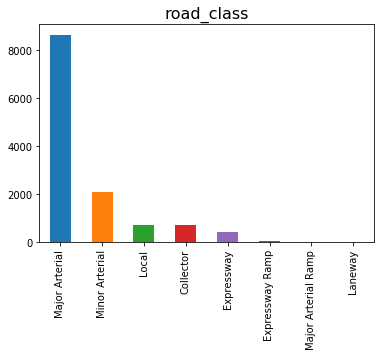

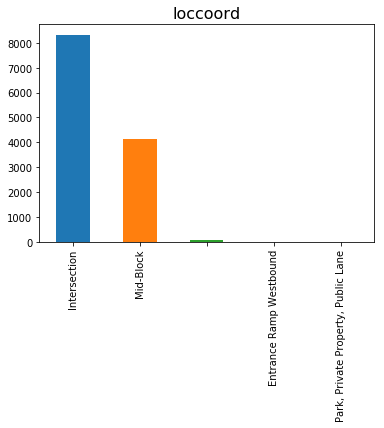

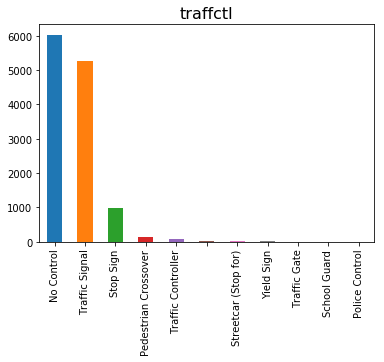

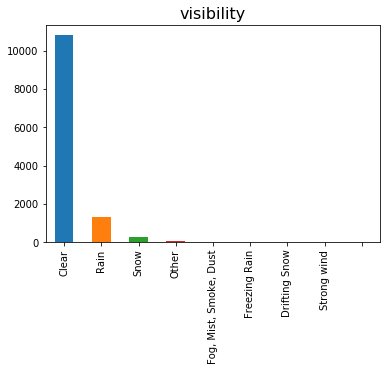

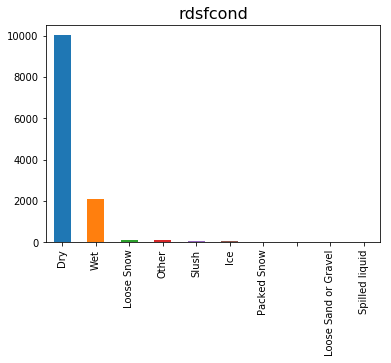

...

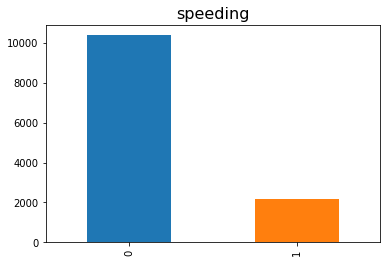

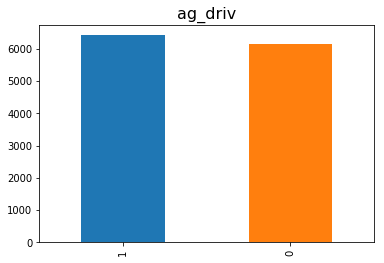

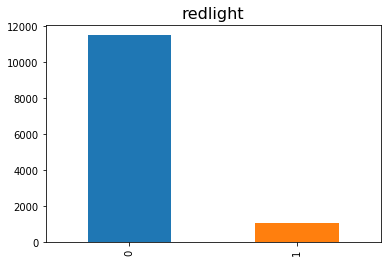

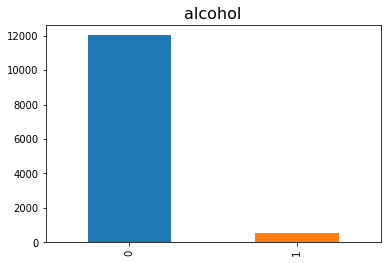

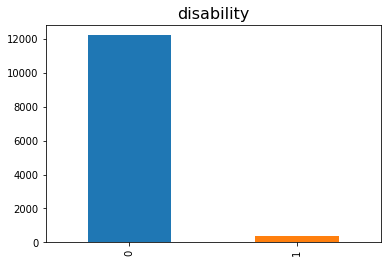

In [13]:
chosen_features_plot = ['road_class','loccoord','traffctl','visibility','rdsfcond','acclass','impactype','injury','initdir',
                        'vehtype','manoeuver','drivact','drivcond','pedestrian','cyclist','automobile','motorcycle','truck',
                        'passenger','speeding','ag_driv','redlight','alcohol','disability']
for t in np.arange(len(chosen_features_plot)):
    plt.figure(t+1)
    df[chosen_features_plot[t]].value_counts().plot(kind="bar")
    plt.title(chosen_features_plot[t],fontsize=16)

#### The hour range of visibility(weather condition) in one day

In [14]:
df_visibility_temp = df[['visibility','hour']]
df_visibility_temp['visibility'].replace(to_replace=' ', value='Other', inplace=True)

Text(0.5,1,'The hour range of visibility(weather condition) in one day')

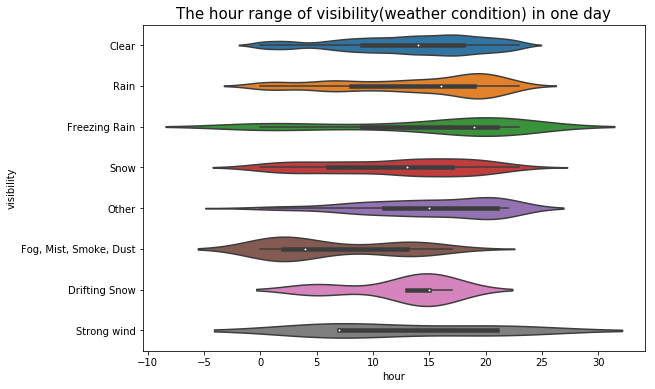

In [15]:
plt.figure(figsize=(9,6))
sns.violinplot(x="hour", y="visibility", data=df_visibility_temp)
plt.title('The hour range of visibility(weather condition) in one day',fontsize=15)

## Data visualization on datetime

#### Number of Accidents in Year

Text(0.5,1,'Number of Accidents in Year')

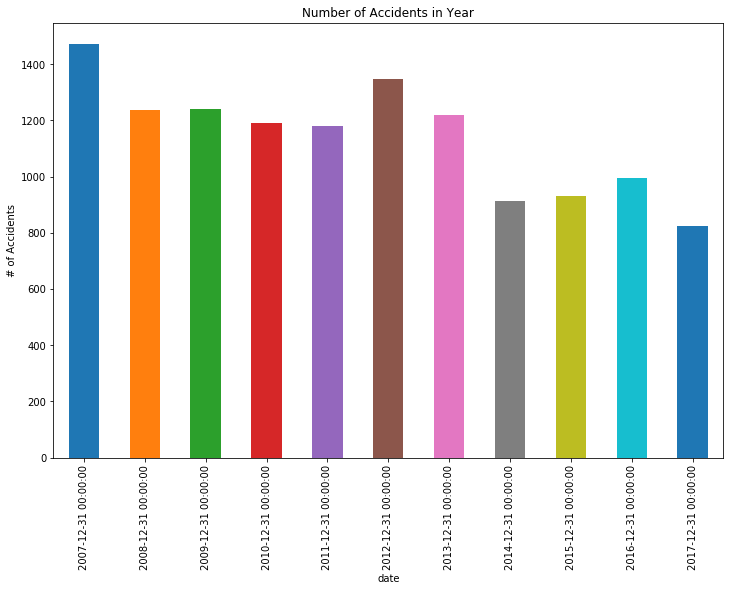

In [16]:
plt.figure(figsize=(12,8))
df_NumYear = df
df_NumYear['count']=1
df_NumYear['date'] = pd.to_datetime(df_NumYear.date)
df_NumYear = df_NumYear.set_index('date')
df_NumYear = df_NumYear.resample('1y').sum()
df_NumYear['count'].plot(kind="bar")
plt.ylabel('# of Accidents')
plt.title('Number of Accidents in Year')

#### Number of Accidents in month

Text(0.5,1,'Number of Accidents in Month')

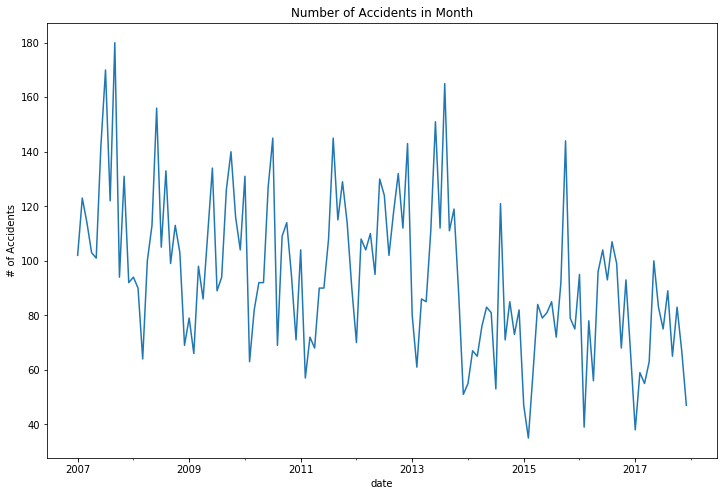

In [17]:
plt.figure(figsize=(12,8))
df_NumMonth = df
df_NumMonth['count']=1
df_NumMonth['date'] = pd.to_datetime(df_NumMonth.date)
df_NumMonth = df_NumMonth.set_index('date')
df_NumMonth = df_NumMonth.resample('1m').sum()
df_NumMonth['count'].plot(kind="line")
plt.ylabel('# of Accidents')
plt.title('Number of Accidents in Month')

#### Number of Accidents in Day

Text(0.5,1,'Number of Accidents in Day')

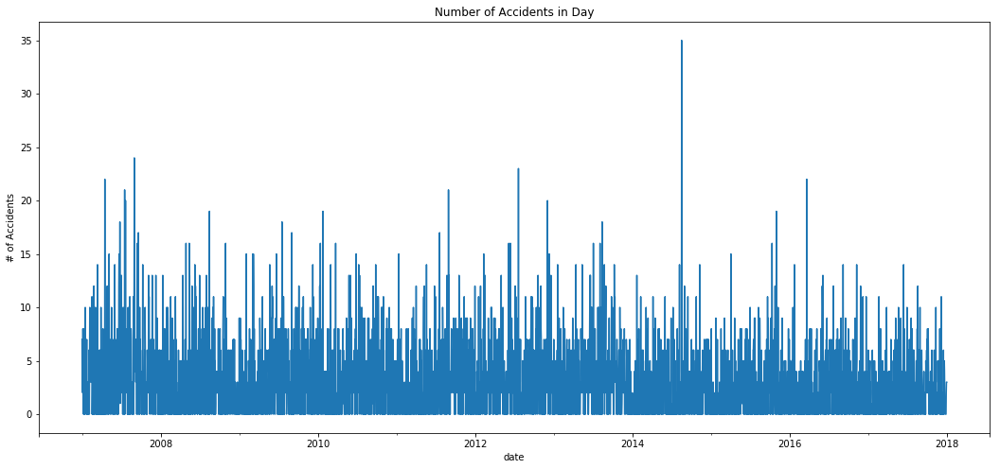

In [18]:
plt.figure(figsize=(18,8))
df_NumDay = df
df_NumDay['count']=1
df_NumDay['date'] = pd.to_datetime(df_NumDay.date)
df_NumDay = df_NumDay.set_index('date')
df_NumDay = df_NumDay.resample('1d').sum()
df_NumDay['count'].plot(kind="line")
plt.ylabel('# of Accidents')
plt.title('Number of Accidents in Day')

## Data visualization on areas

#### Collisions by ward, by neighbourhood, by district

Text(0.5,1,'Total Number of Collisions by Ward from 2007 to 2017')

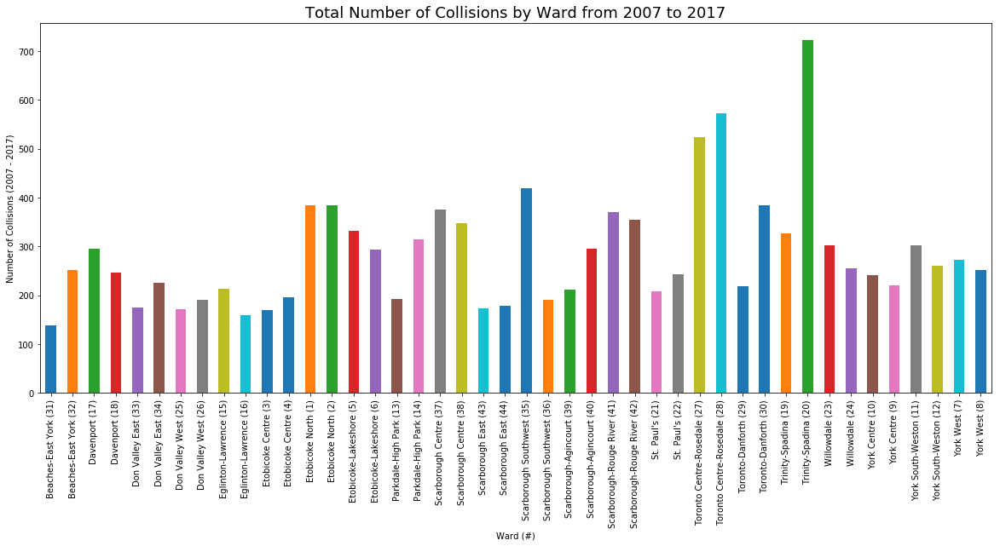

In [19]:
plt.figure(figsize=(20,8))
df.groupby('ward_name').ward_name.count().plot.bar(ylim=0)
plt.xlabel('Ward (#)')
plt.ylabel('Number of Collisions (2007 - 2017)')
plt.title('Total Number of Collisions by Ward from 2007 to 2017',fontsize=18)

#### Collisions by neighbourhood

Text(0.5,1,'Total Number of Collisions by Neighbourhood from 2007 to 2017')

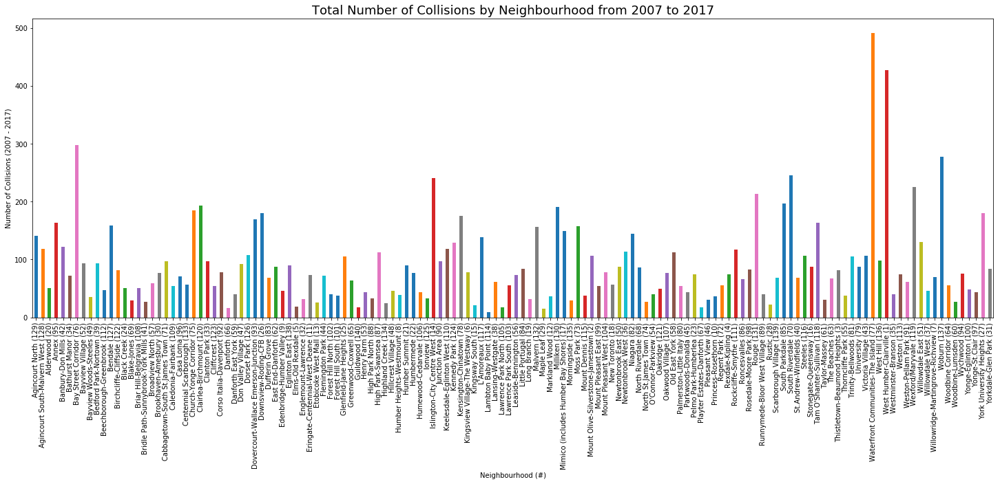

In [20]:
plt.figure(figsize=(25,8))
df.groupby('hood_name').hood_name.count().plot.bar(ylim=0)
plt.xlabel('Neighbourhood (#)')
plt.ylabel('Number of Collisions (2007 - 2017)')
plt.title('Total Number of Collisions by Neighbourhood from 2007 to 2017',fontsize=18)

#### Collisions by district

Text(0.5,1,'Total Number of Collisions by district from 2007 to 2017')

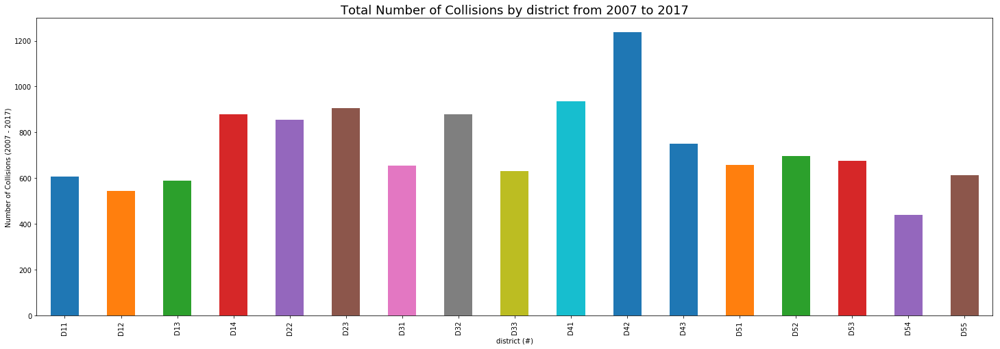

In [21]:
plt.figure(figsize=(25,8))
df.groupby('division').division.count().plot.bar(ylim=0)
plt.xlabel('district (#)')
plt.ylabel('Number of Collisions (2007 - 2017)')
plt.title('Total Number of Collisions by district from 2007 to 2017',fontsize=18)

#### Injury type of collisions showed in map

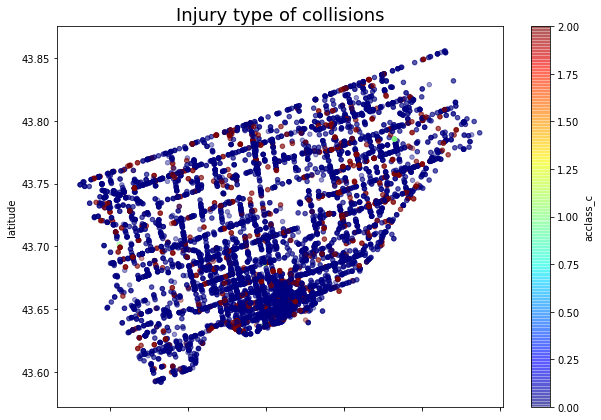

In [22]:
df['acclass_c']=df['acclass'].apply(lambda x: 0 if x =="Non-Fatal Injury" else(2 if x=='Fatal' else 1) )
df.plot(kind="scatter", x="longitude", y="latitude",
    c='acclass_c', cmap=plt.get_cmap("jet"),
    colorbar=True, alpha=0.4, figsize=(10,7),
)
plt.title('Injury type of collisions',fontsize=18)
plt.show()

## Collision and police station position

In this part, we analyze where collisions happen and plot them on a real map. Combined with police stations in Toronto, we try to find out where in this city may need more police stations, which will help deal with collisions better.

#### Show the position of every collision

<Figure size 1080x720 with 0 Axes>

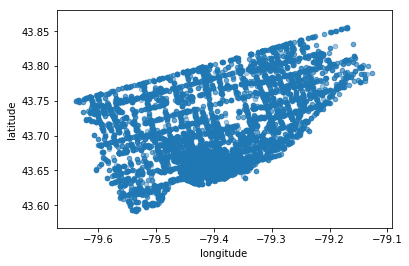

In [23]:
plt.figure(figsize=(15,10))
df.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4)
plt.show()

#### Introduce a new dataset of police station in the city of Toronto, combine with all the positions of collisions, plot the grath.

In [24]:
data_policestation = pd.read_json('https://opendata.arcgis.com/datasets/d8ad1ca539bd451cb15c99fb487d2bdf_0.geojson')
df_policestation = json_normalize(data_policestation["features"])
df_policestation.head()
df_policestation.rename(columns=lambda x: x.replace('properties.', ''), inplace=True)
df_policestation.rename(columns=lambda x: x.replace('geometry.', ''), inplace=True)
df_policestation.rename(columns=lambda x: x.lower(), inplace=True)
df_policestation.head()

longitude_station=[]
latitude_station=[]
for i in range(len(df_policestation['coordinates'])):
    coordinates= df_policestation.iloc[i]['coordinates']
    longitude_station.append(coordinates[0])
    latitude_station.append(coordinates[1])
# print(longitude)
# print(latitude)

df_policestation['longitude']=longitude_station
df_policestation['latitude']= latitude_station
df_policestation.head()


,coordinates,type,address,label,objectid,organization,postal_code,type,longitude,latitude
0,"[-79.58351786788998, 43.74385988110751]",Point,5230 FINCH AVE W,23 Division,1,Toronto Police Services,M9V 0A1,Feature,-79.583518,43.743860
1,"[-79.41721878556721, 43.63762404140122]",Point,9 HANNA AVE,Traffic Services,2,Toronto Police Services,M6K 1W8,Feature,-79.417219,43.637624
2,"[-79.1740536941775, 43.770828752469136]",Point,4331 LAWRENCE AVE E,43 Division,3,Toronto Police Services,M1E 2T4,Feature,-79.174054,43.770829
3,"[-79.41765017231329, 43.63501061638705]",Point,15 NOVA SCOTIA AVE,Mounted Unit,4,Toronto Police Services,M6K 3C3,Feature,-79.417650,43.635011
4,"[-79.50347874199355, 43.605077772447494]",Point,70 BIRMINGHAM ST,Police College,5,Toronto Police Services,M8V 3W6,Feature,-79.503479,43.605078


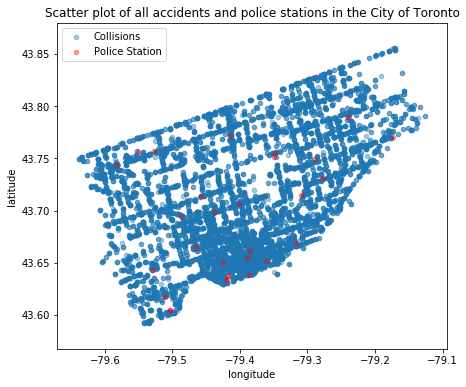

In [25]:
ax = df.plot(kind="scatter", x="longitude", y="latitude",label='Collisions',alpha=0.4)
fig_station= df_policestation.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,color='r',ax=ax,label='Police Station',figsize=(7,6))
plt.title("Scatter plot of all accidents and police stations in the City of Toronto")
plt.show()

#### Plot the above graph on Google Map

In [26]:
latitude_all=df['latitude'].values.tolist()
longitude_all=df['longitude'].values.tolist()
#gmap = gmplot.GoogleMapPlotter.from_geocode("Toronto") 
gmap = gmplot.GoogleMapPlotter(latitude_all[0],longitude_all[0],18)

# heatmap plot heating Type 
# points on the Google map 

gmap.heatmap(latitude_all,longitude_all)

for i in np.arange(len(df_policestation.latitude.values)):
    gmap.marker(df_policestation.latitude.values[i],df_policestation.longitude.values[i])

gmap.draw("map_police_station.html" )

## Fatal collisions and hospital positions

In this part, we analyze where fatal collisions happen and plot them on a real map. Combined with hospitals in Toronto, we try to find out where in this city may need more hospitals, which may save more lives when fatal collisions happen.

#### Introduce a new dataset of hostipals in the city of Toronto, combine with all the positions of fatal collisions, plot the grath.

In [27]:
data_fatal = pd.read_json('https://opendata.arcgis.com/datasets/1b2929dc396d4fd38917fdde37fd22d9_0.geojson')
df_fatal = json_normalize(data_fatal["features"])
df_fatal.head() 
df_fatal.rename(columns=lambda x: x.replace('properties.', ''), inplace=True)
df_fatal.rename(columns=lambda x: x.replace('geometry.', ''), inplace=True)
df_fatal.rename(columns=lambda x: x.lower(), inplace=True)
df_fatal.head()

longitude_fatal=[]
latitude_fatal=[]
for i in range(len(df_fatal['coordinates'])):
    coordinates_fatal= df_fatal.iloc[i]['coordinates']
    longitude_fatal.append(coordinates_fatal[0])
    latitude_fatal.append(coordinates_fatal[1])
# print(longitude)
# print(latitude)

df_fatal['longitude']=longitude_fatal
df_fatal['latitude']= latitude_fatal
df_fatal.head()

,coordinates,type,acclass,accloc,accnum,ag_driv,alcohol,automobile,cycact,cyccond,...,time,traffctl,trsn_city_veh,truck,vehtype,visibility,ward_id,ward_name,year,type
0,"[-79.42689029, 43.66174538]",Point,Fatal,At Intersection,1215284,Yes,,,,,...,0,No Control,Yes,,Other,Clear,19,Trinity-Spadina (19),2011,Feature
1,"[-79.34788904, 43.77494391]",Point,Fatal,,1368270,,,Yes,,,...,1,No Control,,,,Rain,33,Don Valley East (33),2013,Feature
2,"[-79.56166468, 43.64589651]",Point,Fatal,At Intersection,5001661734,Yes,Yes,Yes,,,...,1,Traffic Signal,,,"Automobile, Station Wagon",Clear,5,Etobicoke-Lakeshore (5),2015,Feature
3,"[-79.36748896, 43.67424353]",Point,Fatal,At Intersection,972843,Yes,,,,,...,2,No Control,,,Motorcycle,Clear,27,Toronto Centre-Rosedale (27),2007,Feature
4,"[-79.30788813, 43.778747159999995]",Point,Fatal,At Intersection,965369,Yes,,Yes,,,...,4,Traffic Signal,,,Motorcycle,Clear,40,Scarborough-Agincourt (40),2007,Feature


In [28]:
df_hospital=pd.read_csv('hospital.csv')
df_hospital

,hospital,latitude,longitude,address
0,Mount Sinai,43.657270,-79.390270,600 University Ave
1,St. Michael’s Hospital,43.654180,-79.377380,30 Bond St.
2,Women’s College Hospital,43.661659,-79.387733,76 Grenville St.
3,Princess Margaret Hospital,43.658210,-79.389930,610 University Ave.
4,Toronto General Hospital,43.659490,-79.386910,200 Elizabeth St.
5,Toronto Western Hospital,43.653440,-79.405740,399 Bathurst St.
6,North York General Hospital,43.769420,-79.364200,4001 Leslie St.
7,North York General Hospital – Branson Division,43.772259,-79.447662,555 Finch Ave. W.
8,Toronto Grace Hospital,43.670340,-79.383200,650 Church St.
9,Sunnybrook,43.720000,-79.380000,2075 Bayview Ave.


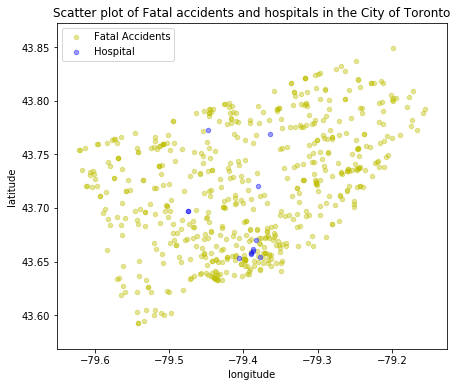

In [29]:
ax_fatal = df_fatal.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,color='y',label='Fatal Accidents')
fig_hospital= df_hospital.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,color='b',ax=ax_fatal,label='Hospital',figsize=(7,6))
plt.title("Scatter plot of Fatal accidents and hospitals in the City of Toronto")
plt.show()

#### Plot the above graph on Google Map

In [30]:
latitude_list = latitude_fatal
  
longitude_list = longitude_fatal

#gmap = gmplot.GoogleMapPlotter.from_geocode("Toronto") 

gmap = gmplot.GoogleMapPlotter(latitude_list[0],longitude_list[0],18)

# heatmap plot heating Type 
# points on the Google map 
gmap.heatmap(latitude_list, longitude_list)

for i in np.arange(len(df_hospital.latitude.values)):
    gmap.marker(df_hospital.latitude.values[i],df_hospital.longitude.values[i])
    
gmap.draw("map_hospital.html" )

## Data analysis for Age range

In this part, we try to analyze the number of collisions (especially the percentage of collisions) in different age range. We want to figure out if age range ralated to collision numbers, and the results show that the age range between 15-24 (in other words, youth people) have higher probability to be involved in a collision. We also analyze some related reasons why youth people are more likely to be involved in a collision, and finally propose some suggestion on this fact. 

#### Show the number of collisions in each age range,and combine them into standrad age range

In [31]:
df.invage.value_counts()

unknown     2114
20 to 24    1134
25 to 29    1083
35 to 39     903
30 to 34     901
50 to 54     886
40 to 44     870
45 to 49     857
55 to 59     734
60 to 64     583
15 to 19     542
65 to 69     455
70 to 74     361
75 to 79     293
80 to 84     218
85 to 89     155
10 to 14     155
5 to 9       134
0 to 4       127
90 to 94      45
Over 95        7
Name: invage, dtype: int64

In [32]:
df[["invage"]] = df[["invage"]].replace("0 to 4", "0-14")
df[["invage"]] = df[["invage"]].replace("5 to 9", "0-14")
df[["invage"]] = df[["invage"]].replace("10 to 14", "0-14")
df[["invage"]] = df[["invage"]].replace("15 to 19", "15-24")
df[["invage"]] = df[["invage"]].replace("20 to 24", "15-24")
df[["invage"]] = df[["invage"]].replace("25 to 29", "25-54")
df[["invage"]] = df[["invage"]].replace("30 to 34", "25-54")
df[["invage"]] = df[["invage"]].replace("35 to 39", "25-54")
df[["invage"]] = df[["invage"]].replace("40 to 44", "25-54")
df[["invage"]] = df[["invage"]].replace("45 to 49", "25-54")
df[["invage"]] = df[["invage"]].replace("50 to 54", "25-54")
df[["invage"]] = df[["invage"]].replace("55 to 59", "55-64")
df[["invage"]] = df[["invage"]].replace("60 to 64", "55-64")
df[["invage"]] = df[["invage"]].replace("65 to 69", "65-84")
df[["invage"]] = df[["invage"]].replace("70 to 74", "65-84")
df[["invage"]] = df[["invage"]].replace("75 to 79", "65-84")
df[["invage"]] = df[["invage"]].replace("80 to 84", "65-84")
df[["invage"]] = df[["invage"]].replace("85 to 89", "85+")
df[["invage"]] = df[["invage"]].replace("90 to 94", "85+")
df[["invage"]] = df[["invage"]].replace("Over 95", "85+")
df[["invage"]] = df[["invage"]].replace("unknown", "Unknown")

In [33]:
df.invage.value_counts()

25-54      5500
Unknown    2114
15-24      1676
65-84      1327
55-64      1317
0-14        416
85+         207
Name: invage, dtype: int64

Text(0.5,1,'# of collisions in each age range')

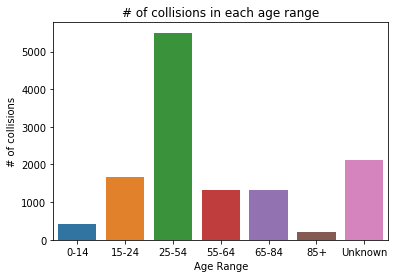

In [34]:
dict_age={'0-14':416,'15-24':1676,'25-54':5500,'55-64':1317,'65-84':1327,'85+':207,'Unknown':2114}
Age = list(dict_age.keys())
number_of_age=list(dict_age.values())
df_Age_collision = pd.DataFrame ({
        'Age': Age,
        'Count':number_of_age
})
fig_age = sns.barplot(x='Age',y='Count', data=df_Age_collision)
plt.xlabel('Age Range')
plt.ylabel('# of collisions')
plt.title('# of collisions in each age range')

#### Introduce a new data set of census, and calculate the percentage of collisions in each age range

In [35]:
df_Age_collision.drop(df_Age_collision.index[6],inplace=True)

In [36]:
df_age_census = pd.read_csv('age.csv')
df_age_census['Number'] = pd.DataFrame(df_age_census['Number'],dtype=np.int)

In [37]:
df_age_census

,Age Range,Number
0,Children (0-14 years),398135
1,Youth (15-24 years),340270
2,Working Age (25-54 years),1229555
3,Pre-retirement (55-64 years),336670
4,Seniors (65+ years),426945
5,Older Seniors (85+ years),66000


In [38]:
age_percentage = np.zeros(len(df_Age_collision['Count']))
for ii in np.arange(len(df_Age_collision['Count'])):
    age_percentage[ii] = df_Age_collision['Count'][ii]/df_age_census['Number'][ii]
age_percentage

array([0.00104487, 0.0049255 , 0.00447316, 0.00391184, 0.00310813,
       0.00313636])

In [39]:
df_Age_collision['percentage'] = age_percentage

In [40]:
df_Age_collision

,Age,Count,percentage
0,0-14,416,0.001045
1,15-24,1676,0.004926
2,25-54,5500,0.004473
3,55-64,1317,0.003912
4,65-84,1327,0.003108
5,85+,207,0.003136


Text(0.5,1,'Percentage of collisions in different age ranges')

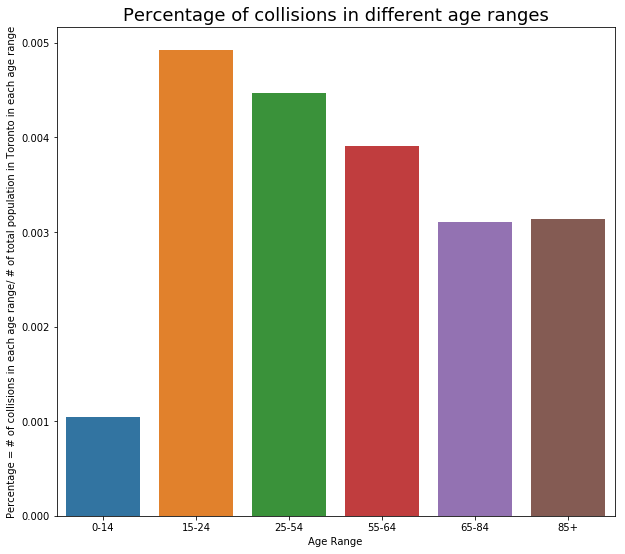

In [41]:
plt.figure(figsize=(10,9))
fig_age_percentage = sns.barplot(x='Age',y='percentage', data=df_Age_collision)
plt.xlabel('Age Range')
plt.ylabel('Percentage = # of collisions in each age range/ # of total population in Toronto in each age range')
plt.title('Percentage of collisions in different age ranges',fontsize=18)

#### Introduce a subset of KSI data set and calcute the percentage of alcohol related collisions in each age range

In [42]:
df_alcohol_related = pd.read_csv('Alcohol_Related.csv')

In [43]:
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("0 to 4", "0-14")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("5 to 9", "0-14")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("10 to 14", "0-14")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("15 to 19", "15-24")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("20 to 24", "15-24")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("25 to 29", "25-54")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("30 to 34", "25-54")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("35 to 39", "25-54")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("40 to 44", "25-54")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("45 to 49", "25-54")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("50 to 54", "25-54")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("55 to 59", "55-64")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("60 to 64", "55-64")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("65 to 69", "65-84")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("70 to 74", "65-84")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("75 to 79", "65-84")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("80 to 84", "65-84")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("85 to 89", "85+")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("90 to 94", "85+")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("Over 95", "85+")
df_alcohol_related[["INVAGE"]] = df_alcohol_related[["INVAGE"]].replace("unknown", "Unknown")

In [44]:
df_alcohol_temp = pd.DataFrame()
df_alcohol_temp['age range'] = df_alcohol_related['INVAGE'].unique()
df_alcohol_temp['number'] = [i for i in df_alcohol_related['INVAGE'].value_counts()]

In [45]:
df_alcohol_temp.drop(df_alcohol_temp.index[2],inplace=True)

In [46]:
df_alcohol = pd.DataFrame()
df_alcohol['age range'] = df_alcohol_temp.sort_values(by='age range')['age range'].values
df_alcohol['number'] = [i for i in df_alcohol_temp.sort_values(by='age range')['number'].values]

In [47]:
age_alcohol_percentage = np.zeros(len(df_alcohol['number']))
for ii in np.arange(len(df_alcohol['number'])):
    age_alcohol_percentage[ii] = df_alcohol['number'][ii]/df_Age_collision['Count'][ii]
age_alcohol_percentage

array([0.00480769, 0.06801909, 0.04563636, 0.02885345, 0.01582517,
       0.04830918])

In [48]:
df_alcohol['percentage'] = age_alcohol_percentage

Text(0.5,1,'Percentage of alcohol related collisions in different age ranges')

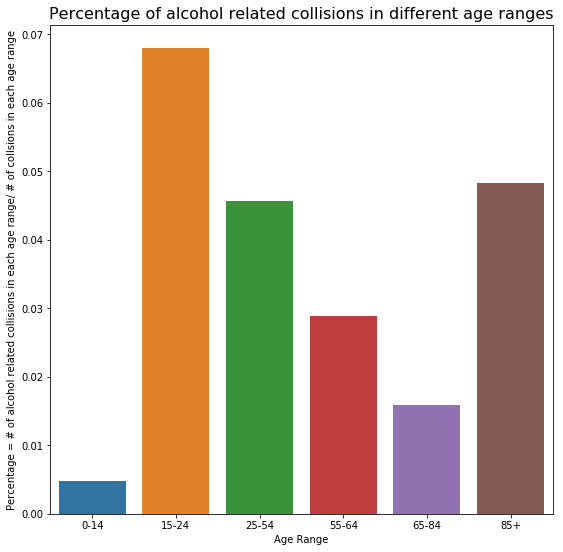

In [49]:
plt.figure(figsize=(9,9))
fig_age_alcohol_percentage = sns.barplot(x='age range',y='percentage', data=df_alcohol)
plt.xlabel('Age Range')
plt.ylabel('Percentage = # of alcohol related collisions in each age range/ # of collsions in each age range')
plt.title('Percentage of alcohol related collisions in different age ranges',fontsize=16)

#### Introduce a subset of KSI data set and calcute the percentage of speeding related collisions in each age range

In [50]:
df_speeding = pd.read_csv('Speeding.csv')

In [51]:
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("0 to 4", "0-14")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("5 to 9", "0-14")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("10 to 14", "0-14")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("15 to 19", "15-24")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("20 to 24", "15-24")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("25 to 29", "25-54")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("30 to 34", "25-54")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("35 to 39", "25-54")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("40 to 44", "25-54")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("45 to 49", "25-54")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("50 to 54", "25-54")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("55 to 59", "55-64")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("60 to 64", "55-64")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("65 to 69", "65-84")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("70 to 74", "65-84")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("75 to 79", "65-84")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("80 to 84", "65-84")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("85 to 89", "85+")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("90 to 94", "85+")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("Over 95", "85+")
df_speeding[["INVAGE"]] = df_speeding[["INVAGE"]].replace("unknown", "Unknown")

In [52]:
df_speeding_temp = pd.DataFrame()
df_speeding_temp['age range'] = df_speeding['INVAGE'].unique()
df_speeding_temp['number'] = [i for i in df_speeding['INVAGE'].value_counts()]

In [53]:
df_speeding_temp.drop(df_speeding_temp.index[1],inplace=True)

In [54]:
df_speeding_related = pd.DataFrame()
df_speeding_related['age range'] = df_speeding_temp.sort_values(by='age range')['age range'].values
df_speeding_related['number'] = [i for i in df_speeding_temp.sort_values(by='age range')['number'].values]

In [55]:
age_speeding_percentage = np.zeros(len(df_speeding_related['number']))
for j in np.arange(len(df_speeding_related['number'])):
    age_speeding_percentage[j] = df_speeding_related['number'][j]/df_Age_collision['Count'][j]
age_speeding_percentage

array([0.02884615, 0.5477327 , 0.07490909, 0.11921033, 0.10173323,
       0.34299517])

In [56]:
df_speeding_related['percentage'] = age_speeding_percentage

Text(0.5,1,'Percentage of speeding related collisions in different age ranges')

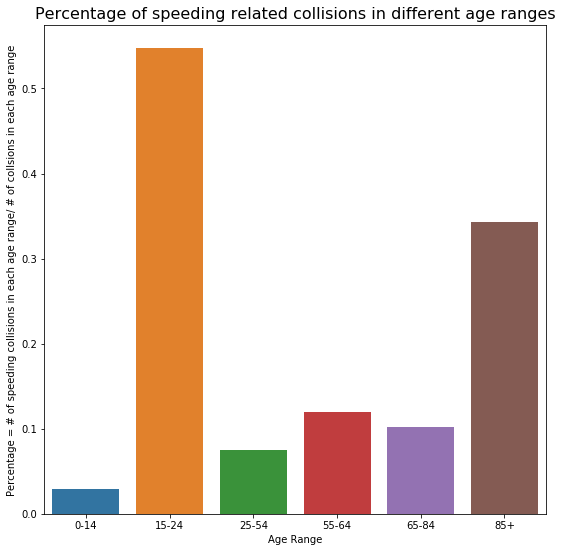

In [57]:
plt.figure(figsize=(9,9))
fig_age_speeding_percentage = sns.barplot(x='age range',y='percentage', data=df_speeding_related)
plt.xlabel('Age Range')
plt.ylabel('Percentage = # of speeding collisions in each age range/ # of collsions in each age range')
plt.title('Percentage of speeding related collisions in different age ranges',fontsize=16)

## Analysis on impact type of collisions

In this part, we try to analyze the impact type of collisions, and we build a machine learning model to predict the type of collisions into three classes (including:pedestrian, cyclist, vehicle) giving some features (including: light conditions, road conditions, visibility, what kind of manoeuver, the type of road, and where it happened).The predictive model gives an idea of what kinds of factors will affect the types of collisions. Also, through verification and optimization, this model should become reliable to help in planning for the city in the future. 

#### Data process (split data by impact type)

There are 10 different types of impacts. However we might want to combine some because they're pretty similar.

In [58]:
df['impactype'].unique()

array(['Pedestrian Collisions', 'Sideswipe', 'SMV Other',
       'Turning Movement', 'Cyclist Collisions', 'Rear End', 'Other',
       'Approaching', 'Angle', 'SMV Unattended Vehicle'], dtype=object)

Text(0.5,1,'Total Number of Collisions by Impact Type from 2007 to 2017')

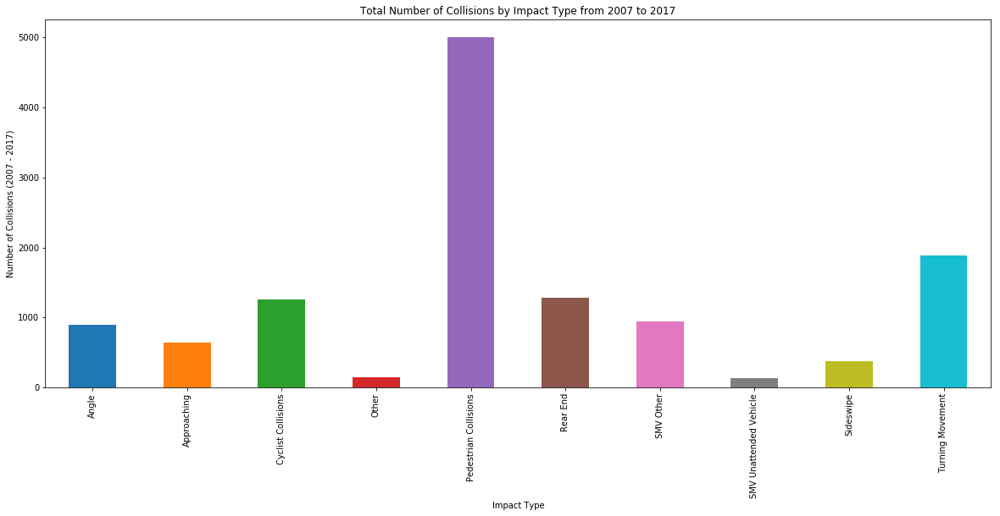

In [59]:
plt.figure(figsize=(20,8))
df.groupby('impactype').impactype.count().plot.bar(ylim=0)
plt.xlabel('Impact Type')
plt.ylabel('Number of Collisions (2007 - 2017)')
plt.title('Total Number of Collisions by Impact Type from 2007 to 2017')

In [60]:
df.drop(df.loc[df['impactype']=='Other'].index, inplace=True)

In [61]:
def group_impactypes(entry):
    if (entry == 'SMV Other'):
        new_entry = 'Vehicle Collisions'
    elif (entry == 'SMV Unattended Vehicle'):
        new_entry = 'Vehicle Collisions'
    elif (entry == 'Rear End' or entry == 'Approaching' or entry == 'Sideswipe' or entry == 'Turning Movement' or entry == 'Angle'):
        new_entry = 'Vehicle Collisions'
    else: 
        new_entry = entry
    return new_entry

df['impactype'] = df.apply(lambda row: group_impactypes(row['impactype']), axis=1)
collision_types = (df['impactype'].unique())
if 'Total' not in collision_types:
    collision_types = np.append(collision_types, 'Total')
print(collision_types)

['Pedestrian Collisions' 'Vehicle Collisions' 'Cyclist Collisions' 'Total']


In [62]:
def split_impactype(df): 
    
    df_coll_ped = df[df.impactype == 'Pedestrian Collisions']
    df_coll_veh = df[df.impactype == 'Vehicle Collisions']
    df_coll_cyclist = df[df.impactype == 'Cyclist Collisions']
    return df_coll_ped, df_coll_veh, df_coll_cyclist
#split_impactype(df)

In [63]:
df['impactype'].unique()

array(['Pedestrian Collisions', 'Vehicle Collisions',
       'Cyclist Collisions'], dtype=object)

#### Plot yearly collision numbers (divided by Impact Type)

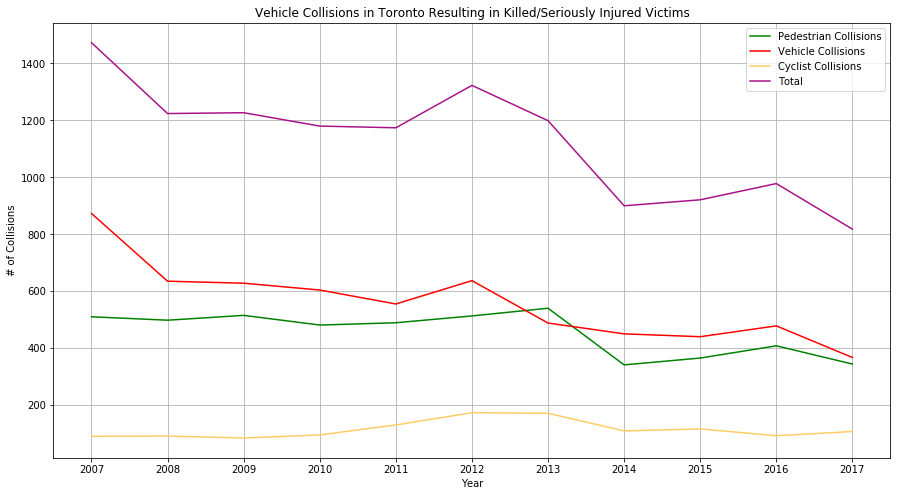

In [64]:
def plot_years_impactype(dataframe): 
    df_coll_ped, df_coll_veh, df_coll_cyclist = split_impactype(dataframe)
    years = sorted(df['year'].unique())

    yearly_coll_ped = pd.value_counts(df_coll_ped['year'], sort=True).reindex(years, fill_value=0).sort_index()
    yearly_coll_veh = pd.value_counts(df_coll_veh['year'], sort=True).reindex(years, fill_value=0).sort_index()
    yearly_coll_cyclist = pd.value_counts(df_coll_cyclist['year'], sort=True).reindex(years, fill_value=0).sort_index()
    yearly_coll_TOTAL = pd.value_counts(dataframe['year'], sort=True).sort_index()

    plt.figure(figsize=(15,8))

    plt.plot(yearly_coll_ped, color='g')
    plt.plot(yearly_coll_veh, color='r')
    plt.plot(yearly_coll_cyclist, color='#FFCD63')
    plt.plot(yearly_coll_TOTAL, color = '#A91188')

    plt.xlabel('Year')
    plt.xticks(years)
    plt.ylabel('# of Collisions')
    plt.grid(axis='both')
    plt.title('Vehicle Collisions in Toronto Resulting in Killed/Seriously Injured Victims')
    plt.legend(collision_types)
    plt.show()
    
plot_years_impactype(df)

#### Plot collision numbers in each hour of a day (divided by Impact Type) 

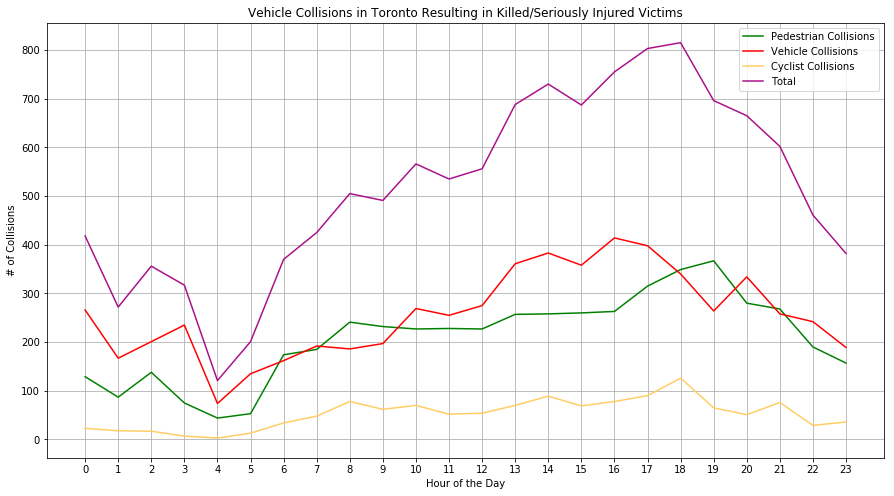

In [65]:
def plot_hours_impactype(dataframe): 
    df_coll_ped, df_coll_veh, df_coll_cyclist = split_impactype(dataframe)
    hours = sorted(df['hour'].unique())

    hourly_coll_ped = pd.value_counts(df_coll_ped['hour'], sort=True).reindex(hours, fill_value=0).sort_index()
    hourly_coll_veh = pd.value_counts(df_coll_veh['hour'], sort=True).reindex(hours, fill_value=0).sort_index()
    hourly_coll_cyclist = pd.value_counts(df_coll_cyclist['hour'], sort=True).reindex(hours, fill_value=0).sort_index()
    
    hourly_coll_TOTAL = pd.value_counts(dataframe['hour'], sort=True).sort_index()
    plt.figure(figsize=(15,8))

    plt.plot(hourly_coll_ped, color='g')
    plt.plot(hourly_coll_veh, color='r')
    plt.plot(hourly_coll_cyclist, color='#FFCD63')
    plt.plot(hourly_coll_TOTAL, color = '#A91188')

    plt.xlabel('Hour of the Day')
    plt.xticks(hours)
    plt.ylabel('# of Collisions')
    plt.grid(axis='both')
    plt.title('Vehicle Collisions in Toronto Resulting in Killed/Seriously Injured Victims')
    plt.legend(collision_types)
    plt.show()
    
plot_hours_impactype(df)

#### Look at each ward in hours or years; split up into impact type

From this part, we can see that different wards have different preferences on types of collisions, which means based on different life stytes, living conditions, ward environments and etc, we can use different strategies to solve their own problems. For example, we can apply 3-D crosswalk to the ward that pedestrian collisions happen the most, or we can prohibit left turning on certain streets where the turning movement collisions happen the most.

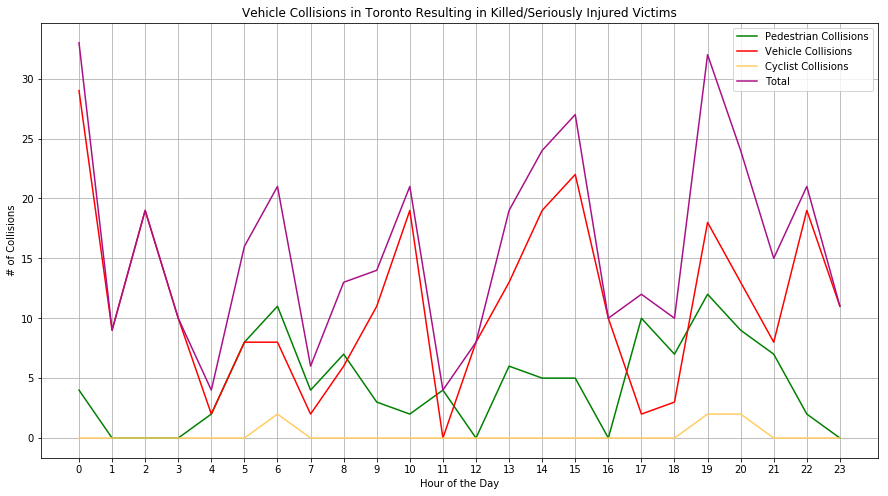

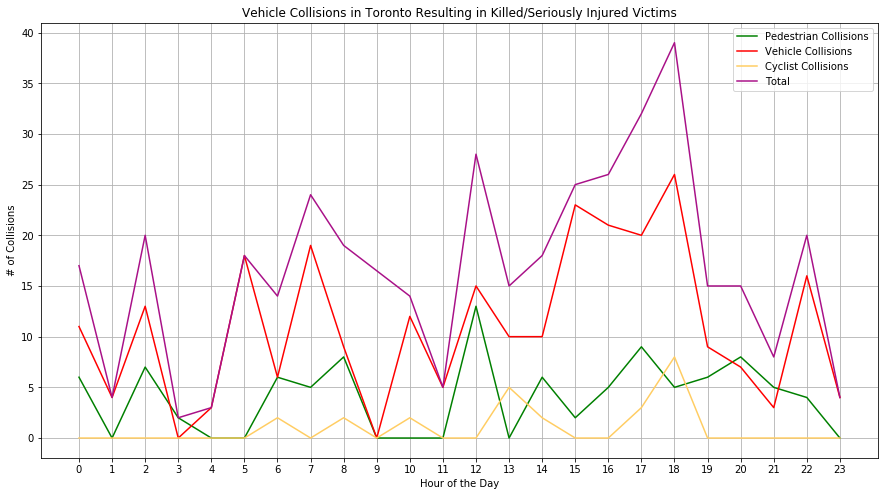

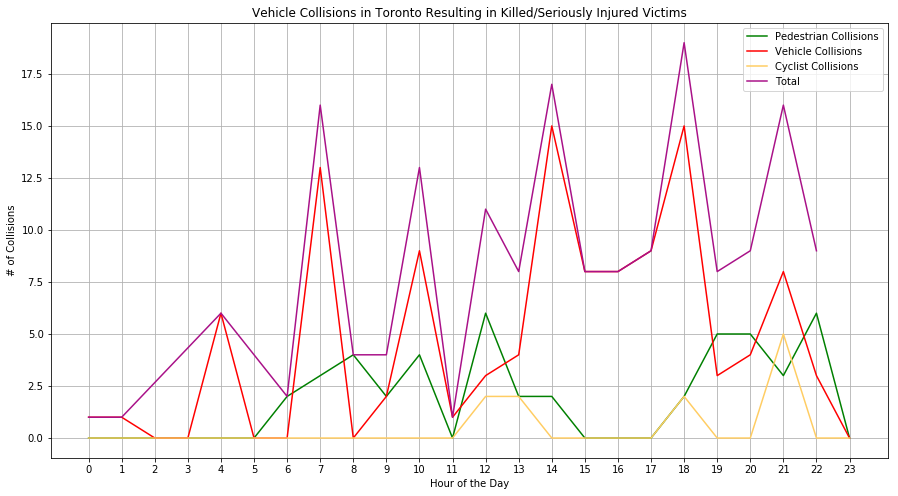

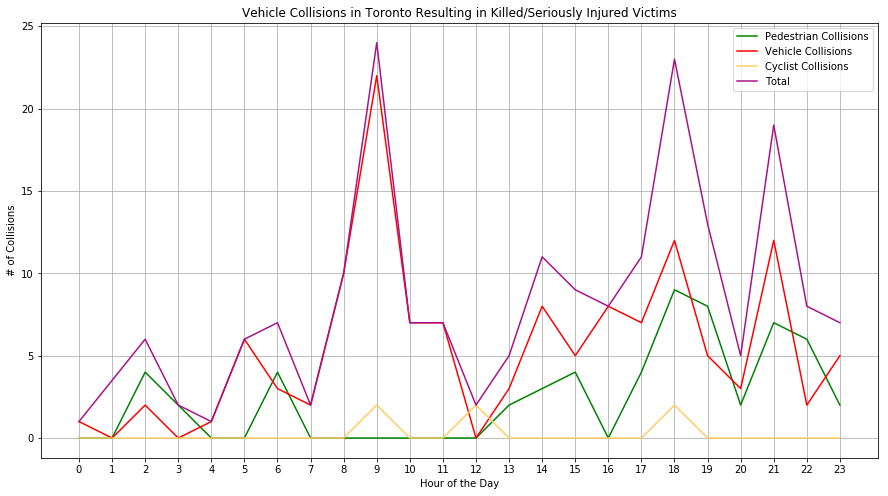

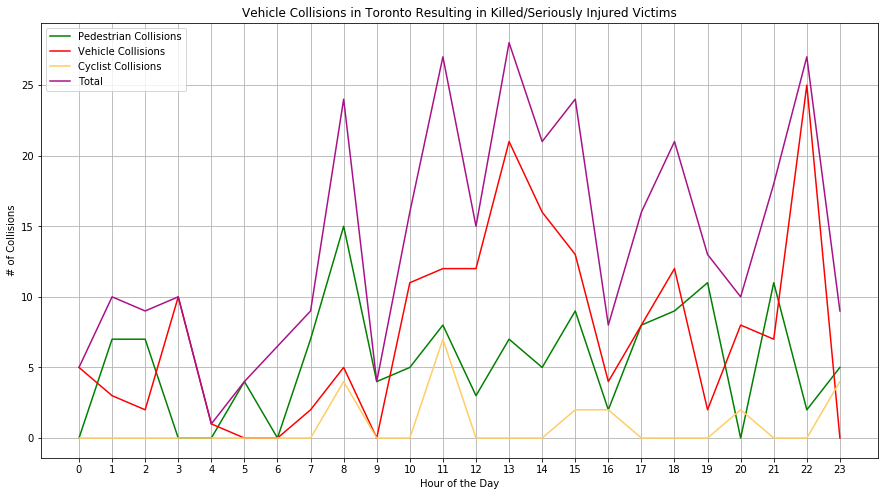

...

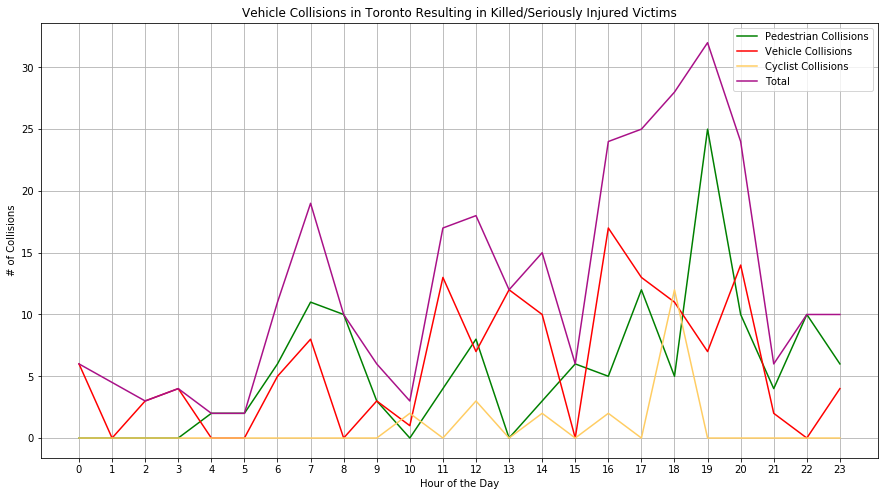

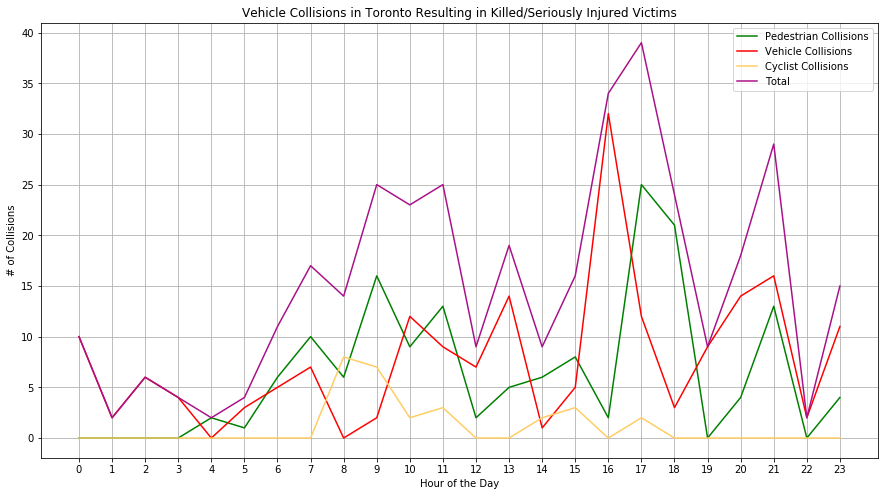

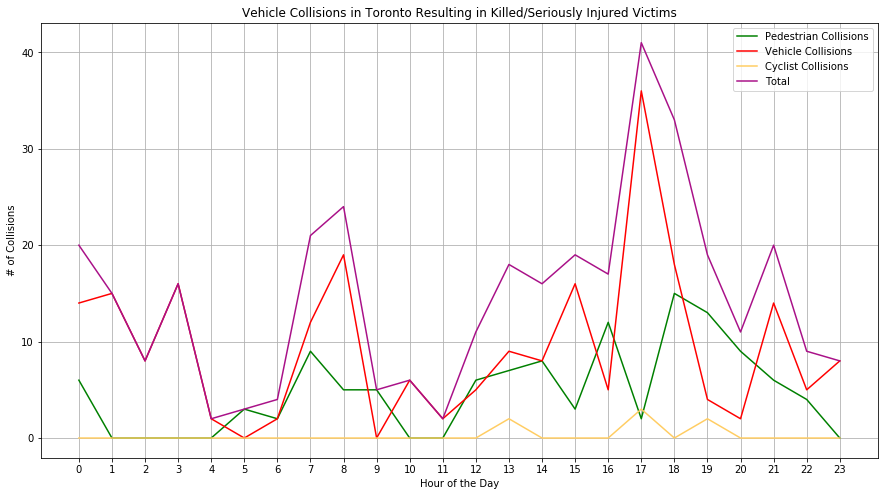

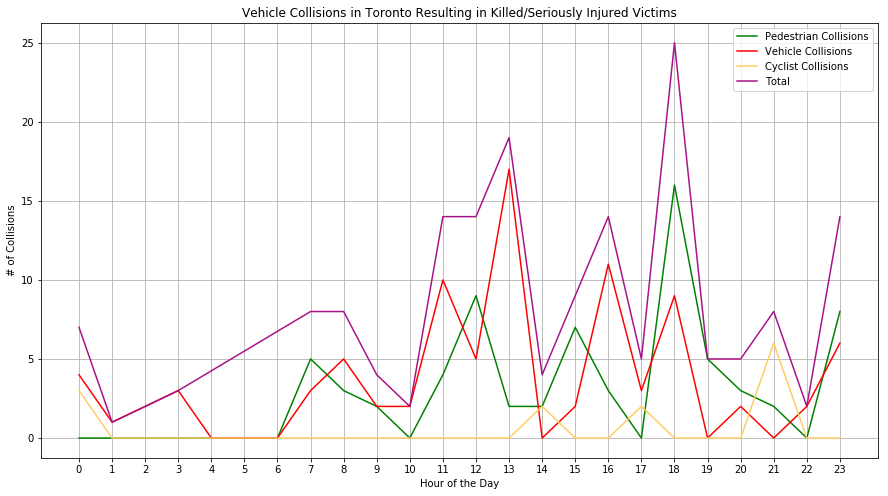

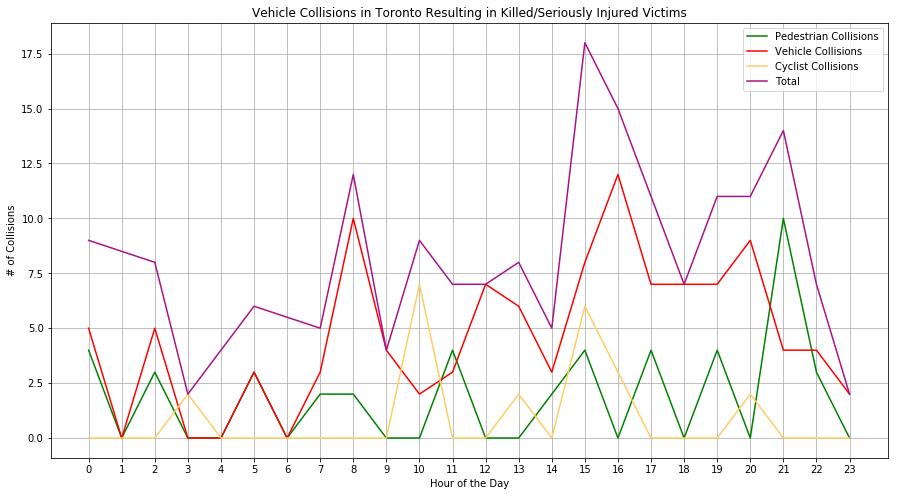

In [66]:
for sub in np.arange(1,len(df.ward_id.unique())+1):
    df_subset_hour = df[df.ward_id == sub]
    plot_hours_impactype(df_subset_hour)

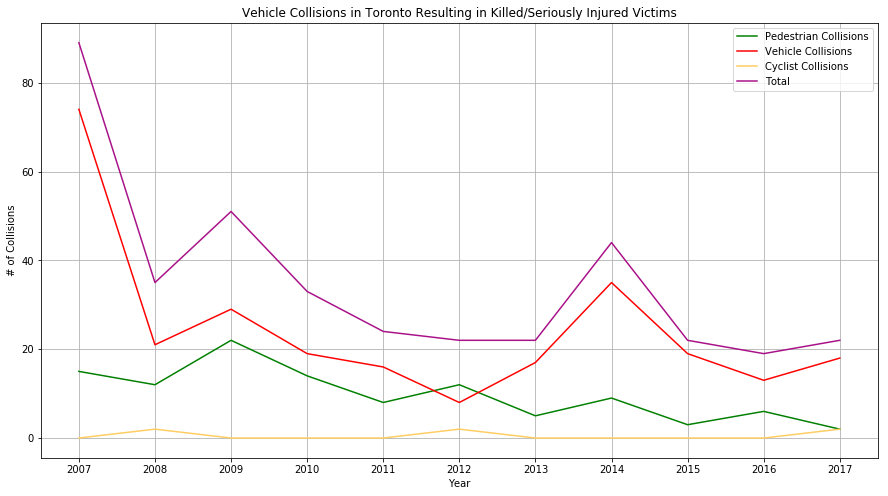

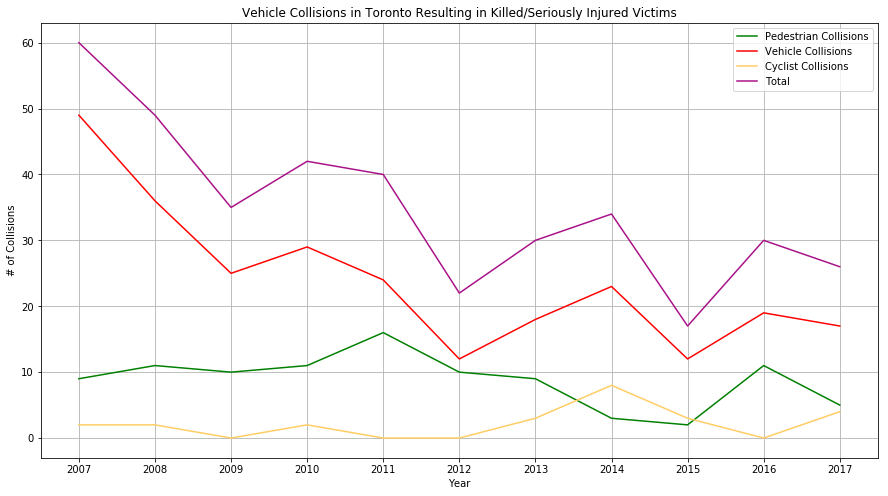

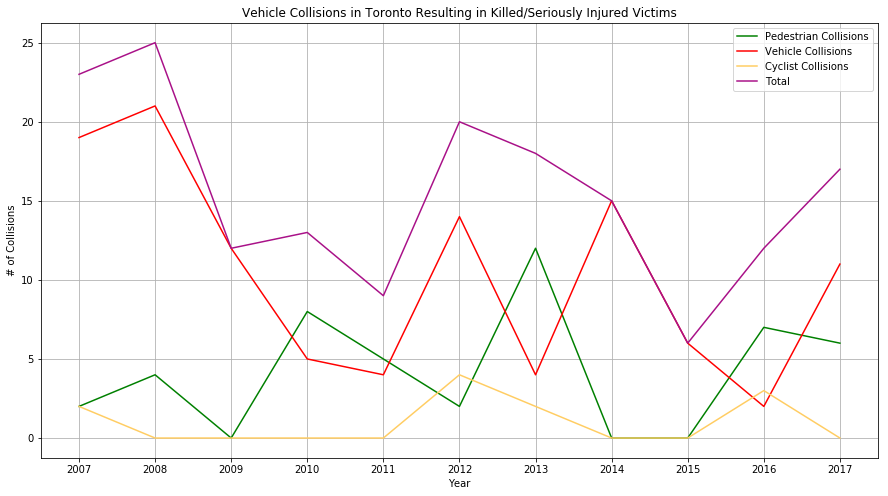

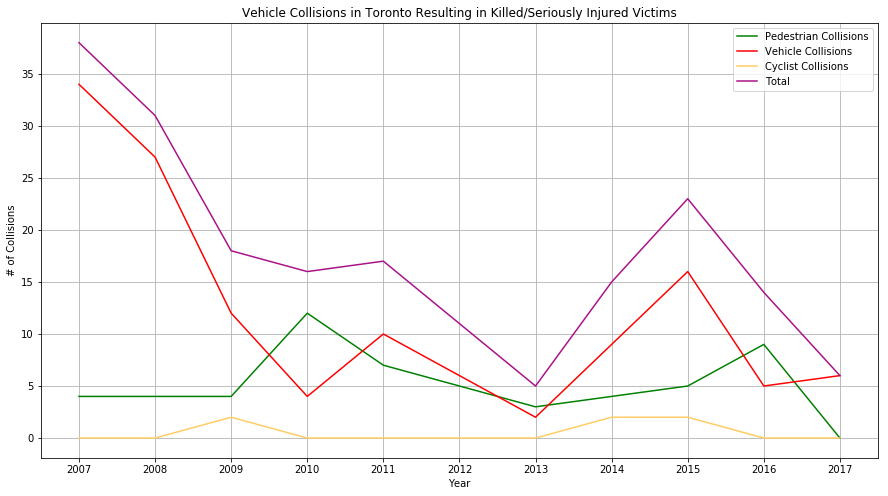

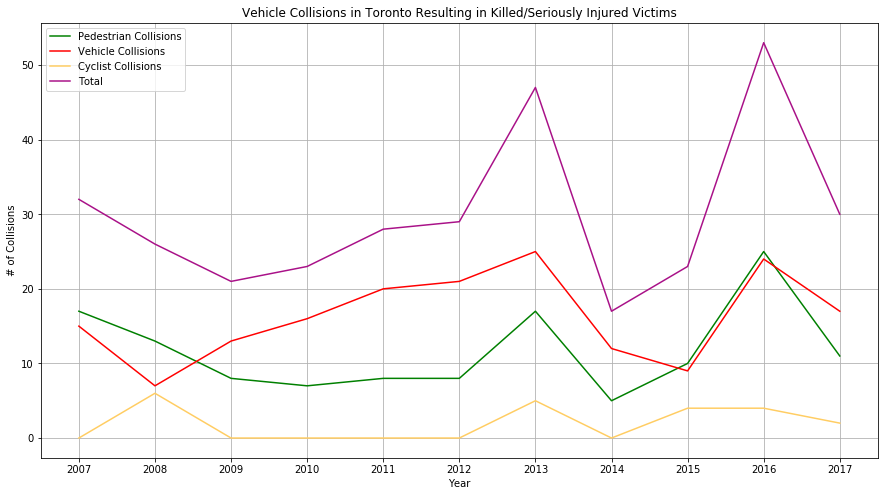

...

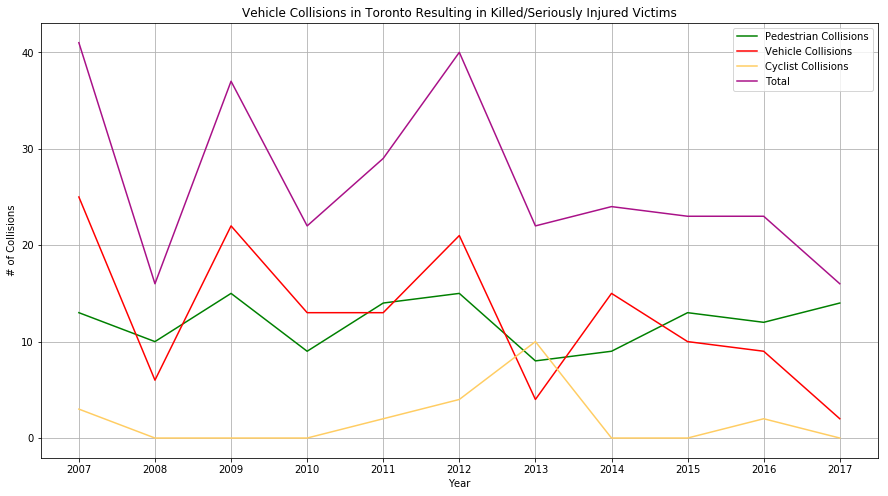

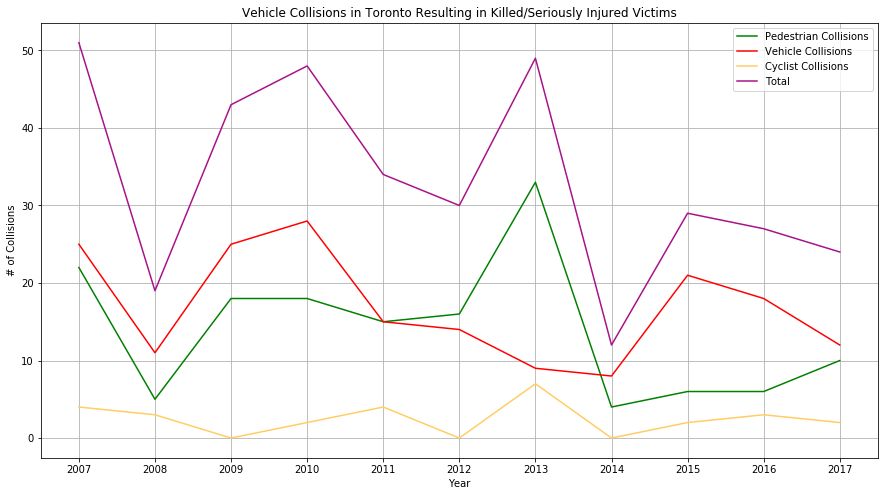

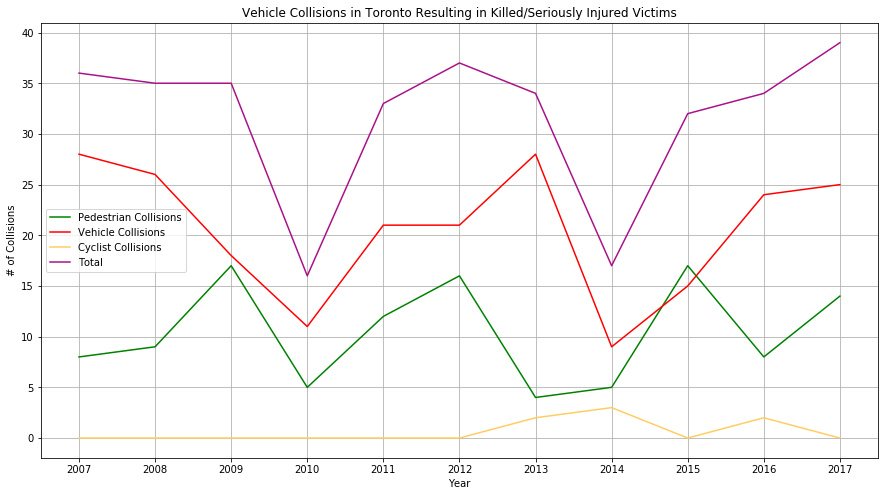

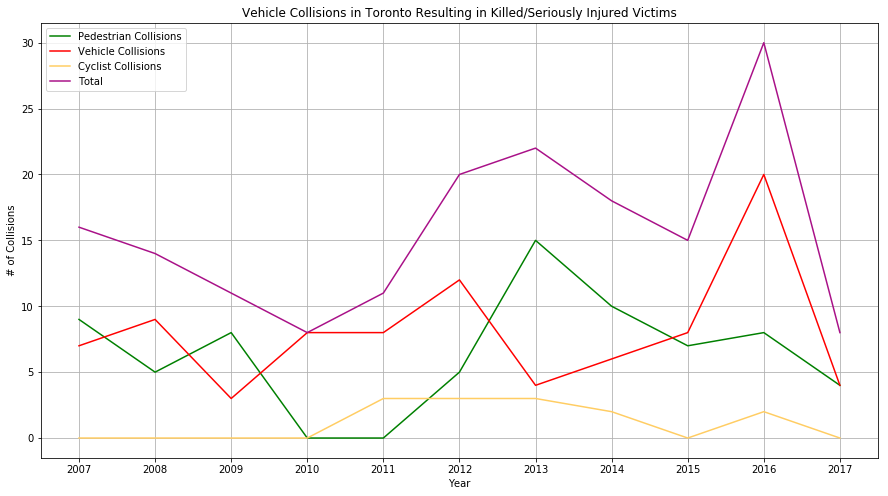

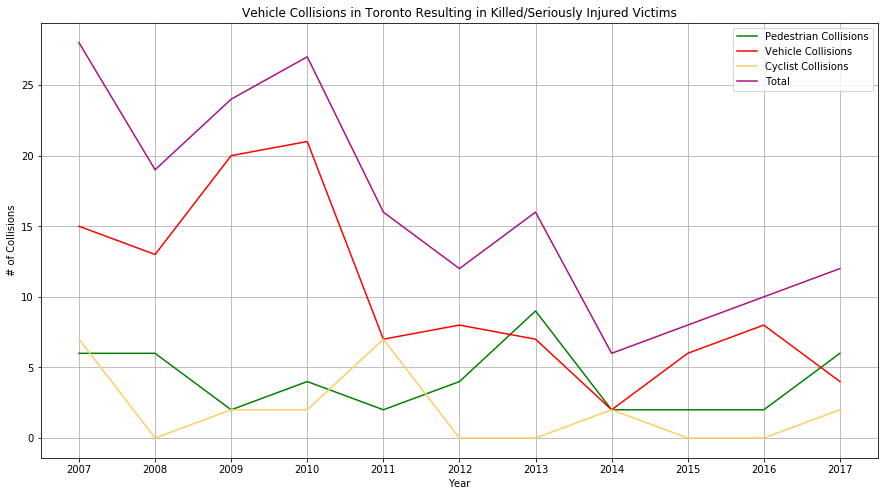

In [67]:
for sub in np.arange(1,len(df.ward_id.unique())+1):
    df_subset_year = df[df.ward_id == sub]
    plot_years_impactype(df_subset_year)

### Feature Selection & Machine Learning Model

Let's try to make a machine learning model that helps us predict the type of collisions. The reasoning behind predicting type of collision is that it might help us in determining what we should be looking out for when trying to prevent fatal collisions. 

Some of the data in our dataset is useful for us to understand the problem, but won't help us to predict the types of collisions so we will leave them out. However, things like visibility, lighting conditions, road conditions, time of day/week/month, what kind of road it is and whether it's an intersection or mid-block, are all indicators that will help us to implement changes to prevent collisions. 

#### Feature Selection

In [68]:
dfnew = df[['visibility','light','rdsfcond', 'initdir','manoeuver','ward_name',
            'date','hour','impactype', 'loccoord', 'accloc', 'road_class', 'year' ]]
dfnew['date'] = pd.to_datetime(dfnew.date)
dfnew['weekday'] = dfnew['date'].dt.weekday
dfnew['month'] = dfnew['date'].dt.month

dfnew.drop(['date'], axis=1, inplace=True)
dfnew.head()

,visibility,light,rdsfcond,initdir,manoeuver,ward_name,hour,impactype,loccoord,accloc,road_class,year,weekday,month
0,Clear,Dark,Dry,West,Going Ahead,Toronto Centre-Rosedale (27),23,Pedestrian Collisions,Mid-Block,,Major Arterial,2011,3,8
1,Clear,"Dark, artificial",Dry,,,Scarborough-Agincourt (40),23,Pedestrian Collisions,Intersection,,Major Arterial,2012,6,8
2,Clear,"Dark, artificial",Dry,South,,Toronto-Danforth (30),23,Pedestrian Collisions,Intersection,At Intersection,Major Arterial,2015,2,12
3,Clear,"Dark, artificial",Dry,,,Scarborough-Agincourt (40),23,Pedestrian Collisions,Intersection,,Major Arterial,2012,6,8
4,Clear,"Dark, artificial",Dry,West,Going Ahead,Scarborough-Agincourt (40),23,Pedestrian Collisions,Intersection,,Major Arterial,2012,6,8


In [69]:
dfnew_X = dfnew.drop(['impactype'], axis=1)
dfnew_y = dfnew['impactype']
df_train_X, df_test_X, df_train_y, df_test_y = train_test_split(dfnew_X, dfnew_y,test_size=0.25) 

df_test_X_noDummies = df_test_X

#### Create dummy features for each categorical feature (both on training set and test set)

In [70]:
dummies_visibility_train = pd.get_dummies(df_train_X['light'], prefix='light')
dummies_light_train = pd.get_dummies(df_train_X['visibility'], prefix='visibility')
dummies_rdsfcond_train = pd.get_dummies(df_train_X['rdsfcond'], prefix='rdsfcond')
dummies_initdir_train = pd.get_dummies(df_train_X['initdir'], prefix='initdir')
dummies_manoeuver_train = pd.get_dummies(df_train_X['manoeuver'], prefix='manoeuver')
dummies_loccoord_train = pd.get_dummies(df_train_X['loccoord'], prefix='loccoord')
dummies_accloc_train = pd.get_dummies(df_train_X['accloc'], prefix='accloc')
dummies_roadClass_train = pd.get_dummies(df_train_X['road_class'], prefix='road_class')
dummies_ward_train = pd.get_dummies(df_train_X['ward_name'], prefix='ward_name')


# Add the new features to the dataframe via concating
tempDF_train = pd.concat([df_train_X, dummies_visibility_train, dummies_light_train, dummies_rdsfcond_train, dummies_initdir_train, 
                   dummies_manoeuver_train, dummies_loccoord_train, dummies_accloc_train, dummies_roadClass_train, dummies_ward_train], axis=1)

# Drop the original categorical feature columns
tempDF_train = tempDF_train.drop(['light', 'visibility', 'rdsfcond', 'initdir', 'manoeuver', 'loccoord', 'accloc', 'road_class', 'ward_name'],axis=1)

df_train_X = tempDF_train.drop(['year'], axis=1)
df_train_X.head()

,hour,weekday,month,light_Dark,"light_Dark, artificial",light_Dawn,"light_Dawn, artificial",light_Daylight,"light_Daylight, artificial",light_Dusk,...,ward_name_Trinity-Spadina (19),ward_name_Trinity-Spadina (20),ward_name_Willowdale (23),ward_name_Willowdale (24),ward_name_York Centre (10),ward_name_York Centre (9),ward_name_York South-Weston (11),ward_name_York South-Weston (12),ward_name_York West (7),ward_name_York West (8)
1285,11,3,10,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4381,16,2,8,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8045,17,1,11,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10214,0,6,8,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1974,10,6,6,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [71]:
dummies_visibility_test = pd.get_dummies(df_test_X['light'], prefix='light')
dummies_light_test = pd.get_dummies(df_test_X['visibility'], prefix='visibility')
dummies_rdsfcond_test = pd.get_dummies(df_test_X['rdsfcond'], prefix='rdsfcond')
dummies_initdir_test = pd.get_dummies(df_test_X['initdir'], prefix='initdir')
dummies_manoeuver_test = pd.get_dummies(df_test_X['manoeuver'], prefix='manoeuver')
dummies_loccoord_test = pd.get_dummies(df_test_X['rdsfcond'], prefix='loccoord')
dummies_accloc_test = pd.get_dummies(df_test_X['accloc'], prefix='accloc')
dummies_roadClass_test = pd.get_dummies(df_test_X['road_class'], prefix='road_class')
dummies_ward_test = pd.get_dummies(df_test_X['ward_name'], prefix='ward_name')
# Add the new features to the dataframe via concating
tempDF_test = pd.concat([df_test_X, dummies_visibility_test, dummies_light_test, dummies_rdsfcond_test, dummies_initdir_test, 
                   dummies_manoeuver_test, dummies_loccoord_test, dummies_accloc_test, dummies_roadClass_test, dummies_ward_test], axis=1)
# Drop the original categorical feature columns
tempDF_test = tempDF_test.drop(['light', 'visibility', 'rdsfcond', 'initdir', 'manoeuver', 'loccoord', 'accloc', 'road_class', 'ward_name'],axis=1)


df_test_X = tempDF_test.drop(['year'], axis=1)
df_test_X.head()

,hour,weekday,month,light_,light_Dark,"light_Dark, artificial",light_Dawn,"light_Dawn, artificial",light_Daylight,"light_Daylight, artificial",...,ward_name_Trinity-Spadina (19),ward_name_Trinity-Spadina (20),ward_name_Willowdale (23),ward_name_Willowdale (24),ward_name_York Centre (10),ward_name_York Centre (9),ward_name_York South-Weston (11),ward_name_York South-Weston (12),ward_name_York West (7),ward_name_York West (8)
9890,2,0,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1158,11,6,4,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
10831,22,0,9,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11882,19,2,2,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2282,9,2,6,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0


#### Get missing columns in the training test and add a missing column in test set with default value equal to 0

In [72]:
missing_cols = set( df_train_X.columns ) - set( df_test_X.columns )
for c in missing_cols:
    df_test_X[c] = 0
df_train_X, df_test_X = df_train_X.align(df_test_X, axis=1)

In [73]:
df_train_X.fillna(0, inplace=True)
df_test_X.fillna(0, inplace=True)

In [74]:
df_train_X.head()

,accloc_,accloc_At Intersection,accloc_At/Near Private Drive,accloc_Intersection Related,accloc_Laneway,accloc_Non Intersection,accloc_Overpass or Bridge,accloc_Private Driveway,accloc_Trail,accloc_Underpass or Tunnel,...,ward_name_Trinity-Spadina (20),ward_name_Willowdale (23),ward_name_Willowdale (24),ward_name_York Centre (10),ward_name_York Centre (9),ward_name_York South-Weston (11),ward_name_York South-Weston (12),ward_name_York West (7),ward_name_York West (8),weekday
1285,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
4381,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
8045,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10214,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6
1974,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6


In [75]:
df_test_X.head()

,accloc_,accloc_At Intersection,accloc_At/Near Private Drive,accloc_Intersection Related,accloc_Laneway,accloc_Non Intersection,accloc_Overpass or Bridge,accloc_Private Driveway,accloc_Trail,accloc_Underpass or Tunnel,...,ward_name_Trinity-Spadina (20),ward_name_Willowdale (23),ward_name_Willowdale (24),ward_name_York Centre (10),ward_name_York Centre (9),ward_name_York South-Weston (11),ward_name_York South-Weston (12),ward_name_York West (7),ward_name_York West (8),weekday
9890,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1158,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,6
10831,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11882,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
2282,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,2


In [76]:
sns.set_style('whitegrid')
X = df_train_X
y = df_train_y

resultDF = pd.DataFrame(columns=['model','hyperparams','train_acc','train_std','test_acc','test_std'])
df_idx = 0

for col in X.columns:
    if (col == '0'):
        X.drop(['0'], axis=1, inplace=True)
        
models = {
    #'knn': KNeighborsClassifier(),
    'log': LogisticRegression(solver='lbfgs'),
    'dt': DecisionTreeClassifier(),
    'rf': RandomForestClassifier(),
    'ab': AdaBoostClassifier(),
}

In [77]:
def crossValidate(typ, model, X, y, hyperparams='default', verbose=0):
    global df_idx
    
    # Update model hyperparameters if given
    if hyperparams is not 'default':
        model.set_params(**hyperparams)
    
    # Initialize scaler class
    scaler = StandardScaler()
    
    # Get kFolds
    kfold = KFold(n_splits=10)
    kfold.get_n_splits(X)

    # Initialize storage vectors
    trainACC = np.zeros(10)
    testACC = np.zeros(10)
    np_idx = 0

    # Loop through folds
    for train_idx, test_idx in kfold.split(X):
        X_train, X_test = X.values[train_idx], X.values[test_idx]
        y_train, y_test = y.values[train_idx], y.values[test_idx]

        # Scale data
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        # Fit to training set
        model.fit(X_train, y_train)

        # Make predictions on testing set
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Compute training and testing accuracy
        trainACC[np_idx] = accuracy_score(y_train, y_train_pred)*100
        testACC[np_idx] = accuracy_score(y_test, y_test_pred)*100
        np_idx += 1
        
        # Print fold accuracy if verbose level 2
        if verbose == 2:
            print ("    Fold {}: Accuracy: {}%".format(np_idx, round(testACC[-1],3)))   

    # Print average accuracy if verbose level 1
    if verbose == 1:
        print ("  Average Score: {}%({}%)".format(round(np.mean(testACC),3),round(np.std(testACC),3)))
    
    # Update dataframe
    resultDF.loc[df_idx, 'model'] = typ
    resultDF.loc[df_idx, 'hyperparams'] = str(hyperparams)
    resultDF.loc[df_idx, 'train_acc'] = trainACC.mean()
    resultDF.loc[df_idx, 'train_std'] = trainACC.std()
    resultDF.loc[df_idx, 'test_acc'] = testACC.mean()
    resultDF.loc[df_idx, 'test_std'] = testACC.std()
    df_idx += 1                                         
                                         
    # Return average testing accuracy, and fitted model
    return testACC.mean(), model

In [78]:
for name, m in models.items():
    print ("Fitting " + name + " model")
    _, models[name] = crossValidate(name, m, X, y, 'default', 1)

Fitting log model
  Average Score: 67.451%(1.36%)
Fitting dt model
  Average Score: 70.5%(1.407%)
Fitting rf model
  Average Score: 72.573%(1.882%)
Fitting ab model
  Average Score: 67.118%(1.275%)


In [79]:
resultDF = resultDF.sort_values('test_acc',ascending=False).reset_index(drop=True)
resultDF.groupby('model').first().sort_values('test_acc',ascending=False)

,hyperparams,train_acc,train_std,test_acc,test_std
model,,,,,
rf,default,99.242314,0.098439,72.572595,1.881755
dt,default,99.990454,0.004773,70.500373,1.407281
log,default,68.481533,0.223847,67.450616,1.360246
ab,default,67.886120,0.372203,67.117802,1.275153


### Tune Hyperparameters (takes a long time! Saved parameters below)

Since kNN usually returned poor results, and logistic regression often did not converge, to save time, only tune hyperparameters of Decision Tree, Random Forest, and the AdaBoost classifier.

In [80]:
models = {
    #'knn': KNeighborsClassifier(),
    #'log': LogisticRegression(solver='lbfgs'),
    'dt': DecisionTreeClassifier(),
    'rf': RandomForestClassifier(),
    #'ab': AdaBoostClassifier()
}

In [81]:
def gridSearch(name, models, param_grids, X, y, num_trials=50, verbose=0):
    # Get model and param grid
    model = models[name]
    current_param_grid = param_grids[name]
    
    # Create variable to store best model
    best_model = model    
    
    # Loop through trials
    for nTrial in range(num_trials):
        if verbose == 2 and nTrial % 10 == 0:
            print ('  Trial: %d' % (nTrial))
            
        # Get current best accuracy for model from the results dataframe
        best_acc = resultDF[resultDF['model'] == name]['test_acc'].max()
        
        # Randomly select params from grid
        params = {}
        for k, v in current_param_grid.items():
            params[k] = np.random.choice(v)
        
        # Cross validate model with selected hyperparams using the function we generated earlier
        acc,model = crossValidate(name, model, X, y, params, 0)
                
        # Update best model if it satisfies our optimizing metric
        if acc > best_acc:
            if verbose == 1:
                print ('    New best ' +  name + ' model: ' + str(acc))
            best_model = model
    # Return best model
    return best_model

In [82]:
param_grids = {}
#param_grids['knn'] = {"n_neighbors": np.arange(1,11,1)}
param_grids['log'] = {'C': [0.001,0.01,0.1,1,10,100],
                      'solver':['newton-cg','lbfgs','liblinear','sag']}
param_grids['dt'] = {'criterion': ['gini','entropy'],
                     'max_depth': np.arange(1,6,1),
                     'min_samples_split': np.arange(3,10,1),
                     'max_features': np.arange(1,6,1)
                     }
param_grids['rf'] =  {'n_estimators': [int(x) for x in np.arange(10,200,10)],
                      'max_features': ['auto','sqrt','log2'],
                      'max_depth': [int(x) for x in np.arange(1,5)] + [None],
                      'min_samples_split': [2,5,10],
                      'min_samples_leaf': [1,2,4],
                      'bootstrap': [True,False]
                      }
param_grids['ab'] = {'n_estimators': [int(x) for x in np.arange(10,200,10)],
                    'learning_rate': [0.01,0.1,1,2]}

#### cell below will take a long time

In [83]:
for name in models.keys():
    print (name)
   # models[name] = gridSearch(name, models, param_grids, X, y, 50, 1)

dt
rf


In [84]:
resultDF = resultDF.sort_values('test_acc',ascending=False).reset_index(drop=True)
resultDF.groupby('model').first().sort_values('test_acc',ascending=False)

,hyperparams,train_acc,train_std,test_acc,test_std
model,,,,,
rf,default,99.242314,0.098439,72.572595,1.881755
dt,default,99.990454,0.004773,70.500373,1.407281
log,default,68.481533,0.223847,67.450616,1.360246
ab,default,67.886120,0.372203,67.117802,1.275153


Because the hyperparameter tuning takes a lot of time, I took the optimal parameters after running it so we wouln't have to hyperparameter tune again. (It is also fairly close to the default parameters.)

In [85]:
rf = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [86]:
rf = models['rf']
rf.fit(X, y) 

X_test = df_test_X
y_test = df_test_y
predictions = rf.predict(X_test)

In [87]:
score_generic = accuracy_score(y_test,predictions)
print('Accuracy for Random Forest for Vehicle Collision Classification: %.2f%%' % (score_generic*100))
print(classification_report(y_test,predictions))
print (confusion_matrix(y_test,predictions))

Accuracy for Random Forest for Vehicle Collision Classification: 71.30%
                       precision    recall  f1-score   support

   Cyclist Collisions       0.56      0.25      0.35       307
Pedestrian Collisions       0.74      0.67      0.71      1272
   Vehicle Collisions       0.70      0.84      0.77      1526

          avg / total       0.71      0.71      0.70      3105

[[  78   81  148]
 [  27  858  387]
 [  34  214 1278]]


In [88]:
resultDF = resultDF.sort_values('test_acc',ascending=False).reset_index(drop=True)
resultDF.groupby('model').first().sort_values('test_acc',ascending=False)

,hyperparams,train_acc,train_std,test_acc,test_std
model,,,,,
rf,default,99.242314,0.098439,72.572595,1.881755
dt,default,99.990454,0.004773,70.500373,1.407281
log,default,68.481533,0.223847,67.450616,1.360246
ab,default,67.886120,0.372203,67.117802,1.275153


## Useful Plots with Model Output

Using the model output, we look at some of the relationships that can be 

In [89]:
df_test_X_noDummies['predictions'] = predictions
df_test_X_noDummies.head()

,visibility,light,rdsfcond,initdir,manoeuver,ward_name,hour,loccoord,accloc,road_class,year,weekday,month,predictions
9890,Clear,Dark,Dry,North,Going Ahead,Toronto Centre-Rosedale (27),2,Mid-Block,,Minor Arterial,2012,0,7,Vehicle Collisions
1158,Clear,Daylight,Dry,East,Slowing or Stopping,York South-Weston (11),11,Intersection,At Intersection,Minor Arterial,2008,6,4,Pedestrian Collisions
10831,Clear,Dark,Dry,,,Toronto Centre-Rosedale (28),22,Mid-Block,,Minor Arterial,2007,0,9,Vehicle Collisions
11882,Other,Dark,Other,Unknown,Unknown,St. Paul's (21),19,Intersection,,Major Arterial,2010,2,2,Pedestrian Collisions
2282,Clear,Daylight,Dry,North,Going Ahead,York South-Weston (11),9,Intersection,At Intersection,Minor Arterial,2008,2,6,Vehicle Collisions


Text(0.5,1,'Month')

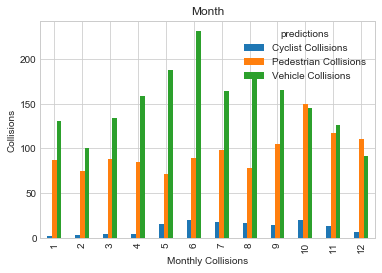

In [90]:
df_month = df_test_X_noDummies
df_month.groupby('month').predictions.value_counts().unstack().plot.bar()
plt.xlabel('Monthly Collisions')
plt.ylabel('Collisions')
plt.title('Month')

Text(0.5,1,'Light Conditions of Collisions')

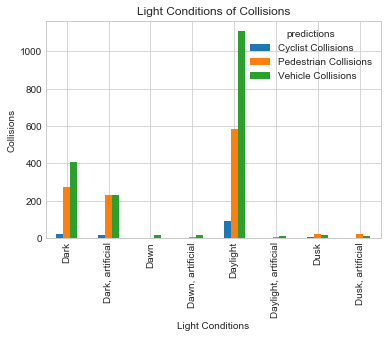

In [91]:
df_light = df_test_X_noDummies.drop(df_test_X_noDummies.loc[df['light']==' '].index)
df_light.groupby('light').predictions.value_counts().unstack().plot.bar()
plt.xlabel('Light Conditions')
plt.ylabel('Collisions')
plt.title('Light Conditions of Collisions')

Text(0.5,1,'Visibility Conditions of Collisions')

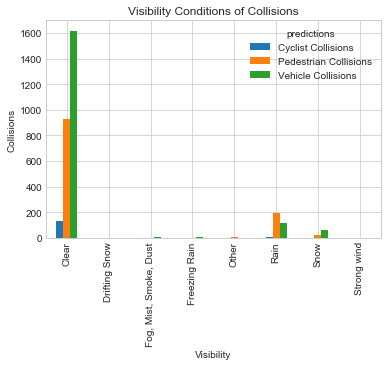

In [92]:
df_visibility = df_test_X_noDummies.drop(df_test_X_noDummies.loc[df['visibility']==' '].index)
df_visibility.groupby('visibility').predictions.value_counts().unstack().plot.bar()
plt.xlabel('Visibility')
plt.ylabel('Collisions')
plt.title('Visibility Conditions of Collisions')

Text(0.5,1,'Locations of Collisions')

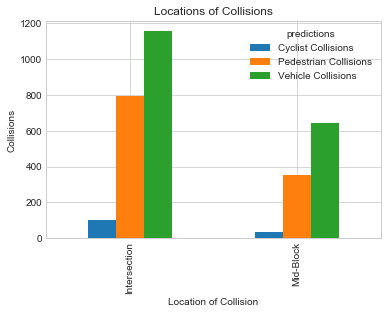

In [93]:
df_loccoord = df_test_X_noDummies.drop(df_test_X_noDummies.loc[df['loccoord']==' '].index)
df_loccoord.groupby('loccoord').predictions.value_counts().unstack().plot.bar()
plt.xlabel('Location of Collision')
plt.ylabel('Collisions')
plt.title('Locations of Collisions')

Text(0.5,1,'Road Classes of Collisions')

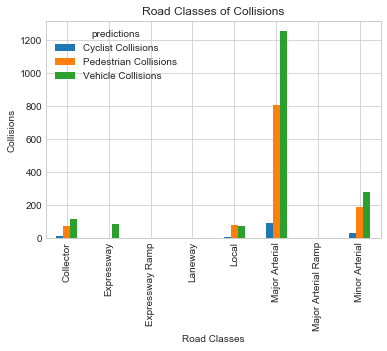

In [94]:
df_road_class = df_test_X_noDummies.drop(df_test_X_noDummies.loc[df['road_class']==' '].index)
df_road_class.groupby('road_class').predictions.value_counts().unstack().plot.bar()
plt.xlabel('Road Classes')
plt.ylabel('Collisions')
plt.title('Road Classes of Collisions')

## Time series analysis for one ward for the whole Toronto(to see prediction for future number of collisions)

In this part, we mainly focus on the number of collisions in each month in the past 10 years, and try to use time series analysis to predict the number of collsions in the next year. In this process, we use the ARIMA model, because in the preprocessing part, using different method, we found out that our data is stationary and there is no trends in our dataset. After preprocessing, we tried different parameters in ARIMA model and finally got the one that performs the best. Using this model, we predict the number of collsions in the next year successfully.

#### Data cleaning for time serise analysis

In [95]:
df_timeindex =  df[['ward_id','hood_id','date','hour']]
df_timeindex['date'] = pd.to_datetime(df_timeindex.date)
df_timeindex['weekday'] = df_timeindex['date'].dt.weekday
df_timeindex['month'] = df_timeindex['date'].dt.month
df_timeindex['year'] = df_timeindex['date'].dt.year
df_timeindex['count']=1 # add "count" column
df_timeindex = df_timeindex.set_index('date') # set date as index
df_timeindex.sort_index(axis = 0)
df_timeindex.head()

,ward_id,hood_id,hour,weekday,month,year,count
date,,,,,,,
2011-08-04,27,76,23,3,8,2011,1
2012-08-19,40,118,23,6,8,2012,1
2015-12-30,30,65,23,2,12,2015,1
2012-08-19,40,118,23,6,8,2012,1
2012-08-19,40,118,23,6,8,2012,1


In [96]:
chosen_ward_id = 1
df_ward1 = df_timeindex[df_timeindex['ward_id']==1]
df_Toronto = df_timeindex

In [97]:
test_df = df_ward1.resample('1m').sum()
df_Toronto = df_Toronto.resample('1m').sum()

In [98]:
test_df.drop(columns=['ward_id','hood_id','weekday','hour','month','year'],inplace=True)
df_Toronto.drop(columns=['ward_id','hood_id','weekday','hour','month','year'],inplace=True)

In [99]:
print(test_df.head())
print(df_Toronto.head())

            count
date             
2007-01-31      3
2007-02-28      0
2007-03-31     17
2007-04-30     10
2007-05-31     20
            count
date             
2007-01-31    102
2007-02-28    123
2007-03-31    113
2007-04-30    103
2007-05-31    101


#### Time serise analysis step by step

Text(0,0.5,'# of collision')

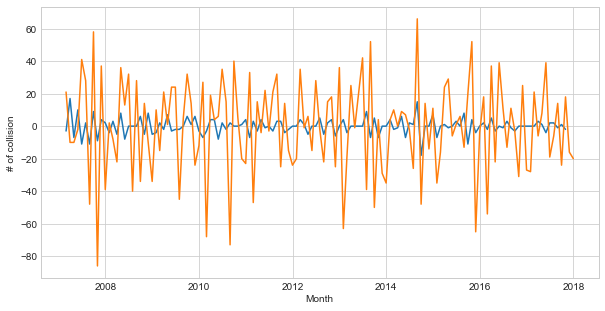

In [100]:
#STEP 1 Difference data to make data stationary on mean (remove trend)
Toronto_df_count = df_Toronto['count']
test_df_count = test_df['count']
plt.figure(figsize=(10, 5))
plt.plot(test_df_count.diff(periods=1))
plt.plot(Toronto_df_count.diff(periods=1))
plt.xlabel('Month')
plt.ylabel('# of collision')

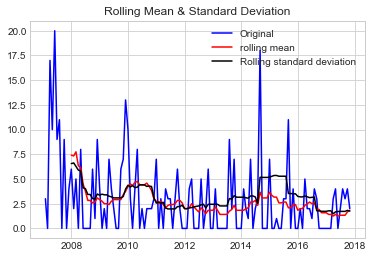

Results of Dickey-Fuller Test:
Test Statistic                -6.153588e+00
p-value                        7.460486e-08
#Lags Used                     2.000000e+00
Number of Observations Used    1.270000e+02
Critical value (1%)           -3.482920e+00
Critical value (5%)           -2.884580e+00
Critical value (10%)          -2.579058e+00
dtype: float64


In [101]:
from statsmodels.tsa.stattools import adfuller
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams

def test_stationarity(timeseries):
    
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()
    
    #plot rolling statistics:
    fig = plt.figure()
    fig.add_subplot()
    orig = plt.plot(timeseries, color = 'blue',label='Original')
    mean = plt.plot(rolmean , color = 'red',label = 'rolling mean')
    std = plt.plot(rolstd, color = 'black', label= 'Rolling standard deviation')
    
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries,autolag = 'AIC')

    dfoutput = pd.Series(dftest[0:4],index = ['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical value (%s)' %key] = value
    
    print(dfoutput)
    
test_df_count = test_df['count']
test_stationarity(test_df_count)

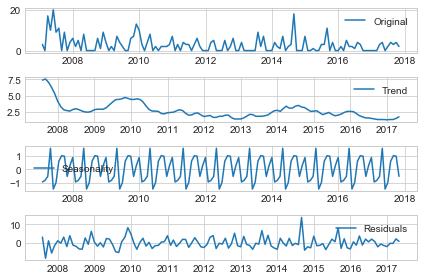

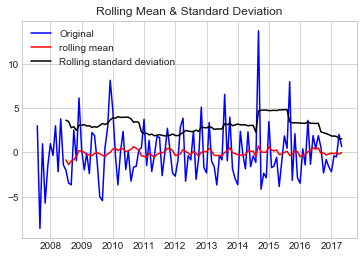

Results of Dickey-Fuller Test:
Test Statistic                -6.096914e+00
p-value                        1.004932e-07
#Lags Used                     1.000000e+01
Number of Observations Used    1.070000e+02
Critical value (1%)           -3.492996e+00
Critical value (5%)           -2.888955e+00
Critical value (10%)          -2.581393e+00
dtype: float64


In [102]:
# Step2: decomposing
from statsmodels.tsa.seasonal import seasonal_decompose
def decompose(timeseries):
    
    decomposition = seasonal_decompose(timeseries)
    
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    plt.subplot(411)
    plt.plot(test_df_count, label='Original')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals')
    plt.legend(loc='best')
    plt.tight_layout()
    
    return trend , seasonal, residual
trend,seasonal,residual = decompose(test_df_count)
residual.dropna(inplace=True)
test_stationarity(residual)

#### Model testing for prediction in one ward

Text(0.5,1,'Prediction')

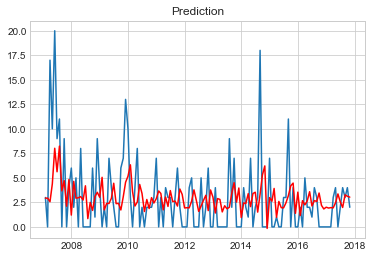

In [103]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(test_df_count, order=(2, 0, 1))  
results_AR = model.fit(disp=-1)  
plt.plot(test_df_count)
plt.plot(results_AR.fittedvalues, color='red')
plt.title('Prediction')

Text(0.5,1,'Prediction')

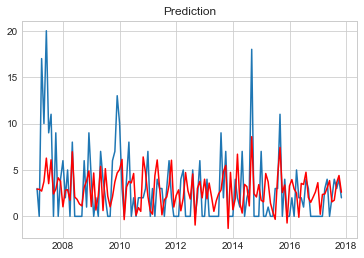

In [104]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(test_df_count, order=(9, 0, 9))  
results_AR = model.fit(disp=-1)  
plt.plot(test_df_count)
plt.plot(results_AR.fittedvalues, color='red')
plt.title('Prediction')

#### Model testing for prediction in the city of Toronto

Text(0.5,1,'Prediction')

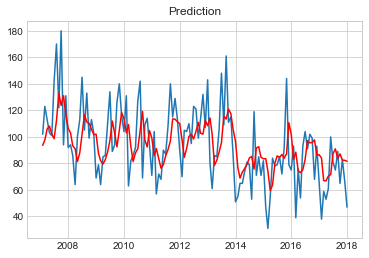

In [105]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(Toronto_df_count, order=(2, 0, 1))  
results_AR_Toronto = model.fit(disp=-1)  
plt.plot(Toronto_df_count)
plt.plot(results_AR_Toronto.fittedvalues, color='red')
plt.title('Prediction')

C:\Users\SteveZhao\Anaconda3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Text(0.5,1,'Prediction')

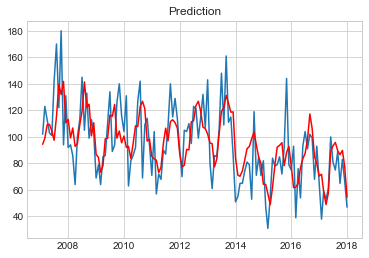

In [106]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(Toronto_df_count, order=(9, 0, 9))  
results_AR_Toronto = model.fit(disp=-1)  
plt.plot(Toronto_df_count)
plt.plot(results_AR_Toronto.fittedvalues, color='red')
plt.title('Prediction')

#### Model results printing

In [107]:
print('ARMA Model Results for one ward:')
print(results_AR.summary())
print('ARMA Model Results for the city of Toronto:')
print(results_AR_Toronto.summary())

ARMA Model Results for one ward:
                              ARMA Model Results                              
Dep. Variable:                  count   No. Observations:                  130
Model:                     ARMA(9, 9)   Log Likelihood                -342.776
Method:                       css-mle   S.D. of innovations              3.177
Date:                Thu, 22 Nov 2018   AIC                            725.552
Time:                        21:20:07   BIC                            782.903
Sample:                    01-31-2007   HQIC                           748.856
                         - 10-31-2017                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.9189      0.343      8.501      0.000       2.246       3.592
ar.L1.count     0.0339      0.100      0.340      0.734      -0.161       0.229
ar.L2.count    

#### Show the prediction results for one ward/ for the city of Toronto

Text(0.5,1,'# of Collision Prediction for the next 12 months in one ward')

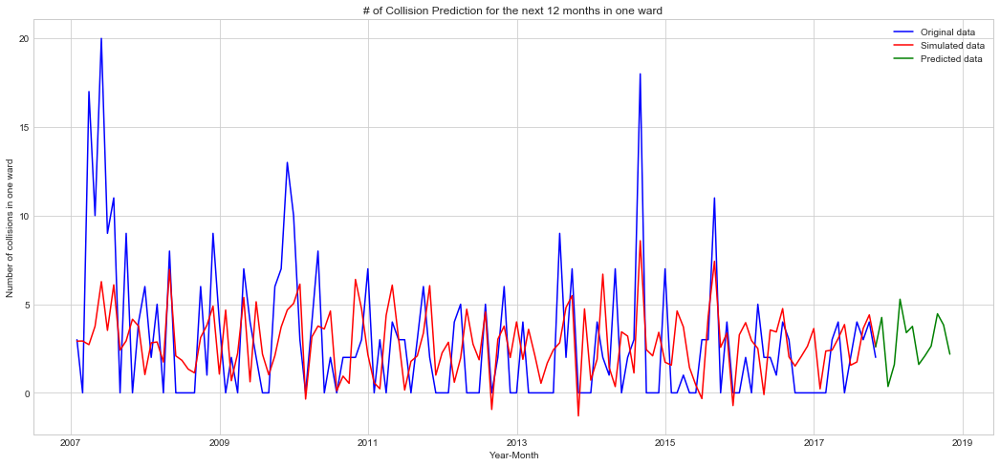

In [115]:
start_index = 129
end_index = start_index+12

forecast = results_AR.predict(start=start_index, end=end_index)

plt.figure(figsize=(18, 8))

plt.plot(test_df_count, color='blue',label='Original data')
plt.plot(results_AR.fittedvalues, color='red',label='Simulated data')
plt.plot(forecast, color='green',label='Predicted data')
plt.legend(loc='best')
plt.xlabel('Year-Month')
plt.ylabel('Number of collisions in one ward')
plt.title('# of Collision Prediction for the next 12 months in one ward')

Text(0.5,1,'# of Collision Prediction for the next 12 months in one ward with data points')

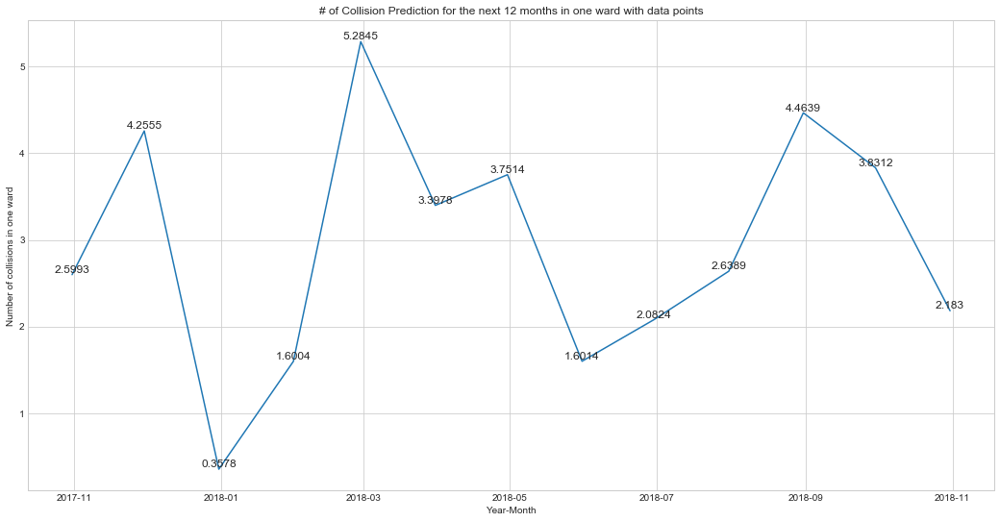

In [117]:
plt.figure(figsize=(18,9))

for a, b in zip(forecast.index, np.around(forecast, decimals=4)):
    plt.text(a, b, b, ha='center', va='bottom', fontsize=12)

plt.plot(forecast)
plt.xlabel('Year-Month')
plt.ylabel('Number of collisions in one ward')
plt.title('# of Collision Prediction for the next 12 months in one ward with data points')

Text(0.5,1,'# of Collision Prediction for the next 12 months(green) in the city of Toronto')

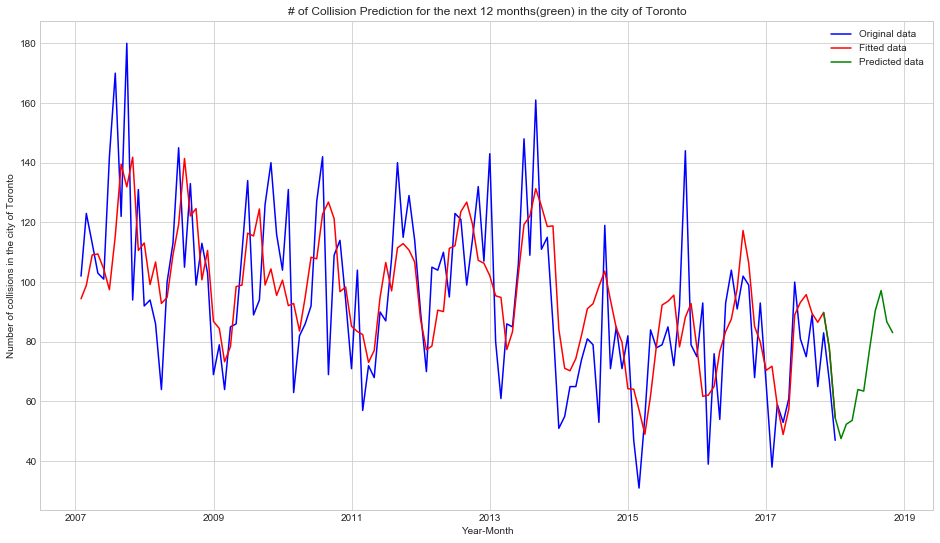

In [114]:
start_index = 129
end_index = start_index+12

forecast_Toronto = results_AR_Toronto.predict(start=start_index, end=end_index)

plt.figure(figsize=(16, 9))

plt.plot(Toronto_df_count, color='blue',label='Original data')
plt.plot(results_AR_Toronto.fittedvalues, color='red',label='Fitted data')
plt.plot(forecast_Toronto, color='green',label='Predicted data')
plt.legend(loc='best')
plt.xlabel('Year-Month')
plt.ylabel('Number of collisions in the city of Toronto')
plt.title('# of Collision Prediction for the next 12 months(green) in the city of Toronto')

Text(0.5,1,'# of Collision Prediction for the next 12 months in the city of Toronto')

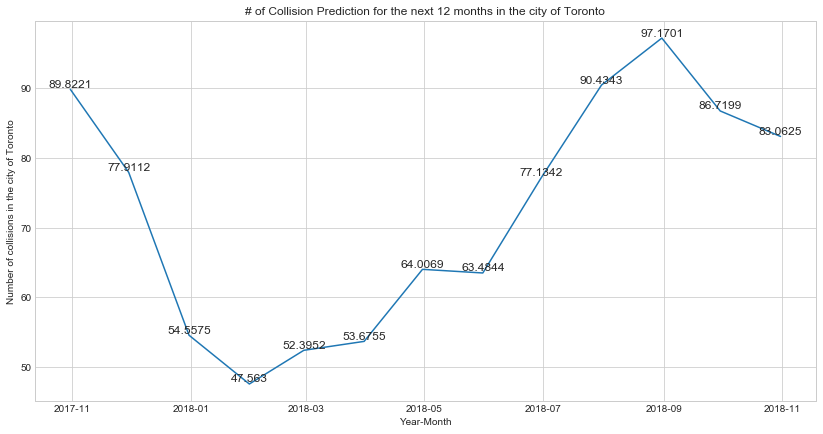

In [113]:
plt.figure(figsize=(14,7))

for a, b in zip(forecast_Toronto.index, np.around(forecast_Toronto, decimals=4)):
    plt.text(a, b, b, ha='center', va='bottom', fontsize=12)

plt.plot(forecast_Toronto)
plt.xlabel('Year-Month')
plt.ylabel('Number of collisions in the city of Toronto')
plt.title('# of Collision Prediction for the next 12 months in the city of Toronto')